# Team Dogs

In [1]:
import pandas as pd
import numpy as np
import re
import os
import random
import shutil

from IPython.display import Image
from sklearn.model_selection import train_test_split

from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import xml.etree.ElementTree as ET
from PIL import Image

import tensorflow as tf
from tensorflow.keras import layers, models, regularizers, callbacks
from tensorflow import keras
import tensorflow_hub as hub
from tensorflow.keras.callbacks import EarlyStopping

import pathlib
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import ResNet50

from tensorflow.keras.datasets import cifar10
from keras.applications.densenet import preprocess_input

from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPool2D, MaxPooling2D, GlobalAvgPool2D, Add, ReLU, Flatten, Dense, Dropout
from tensorflow.keras import Model
from tensorflow.keras.models import Model, Sequential

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3

  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Stanford Dogs Dataset

## How many breeds and pictures we have

In [2]:
breed_list = os.listdir("../input/stanford-dogs-dataset/images/Images/")

# # Remove 'n[number]-' part from each item in the list
# breed_list = [re.sub(r'^n\d+-', '', item).lower() for item in breed_list]
# Sort the cleaned data alphabetically
# breed_list = sorted(breed_list)

# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
breed_list = sorted(breed_list, key=custom_sort_key)

num_classes = len(breed_list)
print("{} breeds".format(num_classes))

n_total_images = 0
for breed in breed_list:
    n_total_images += len(os.listdir("../input/stanford-dogs-dataset/images/Images/{}".format(breed)))
print("{} images".format(n_total_images))

120 breeds

20580 images


In [3]:
label_maps = {}
label_maps_rev = {}
for i, v in enumerate(breed_list):
    label_maps.update({v: i})
    label_maps_rev.update({i : v})

In [4]:
def show_dir_images(breed, n_to_show):
    plt.figure(figsize=(16,16))
    img_dir = "../input/stanford-dogs-dataset/images/Images/{}/".format(breed)
    images = os.listdir(img_dir)[:n_to_show]
    for i in range(n_to_show):
        img = mpimg.imread(img_dir + images[i])
        plt.subplot(int(n_to_show/4+1), 4, i+1)
        plt.imshow(img)
        plt.axis('off')

n02088094-Afghan_hound


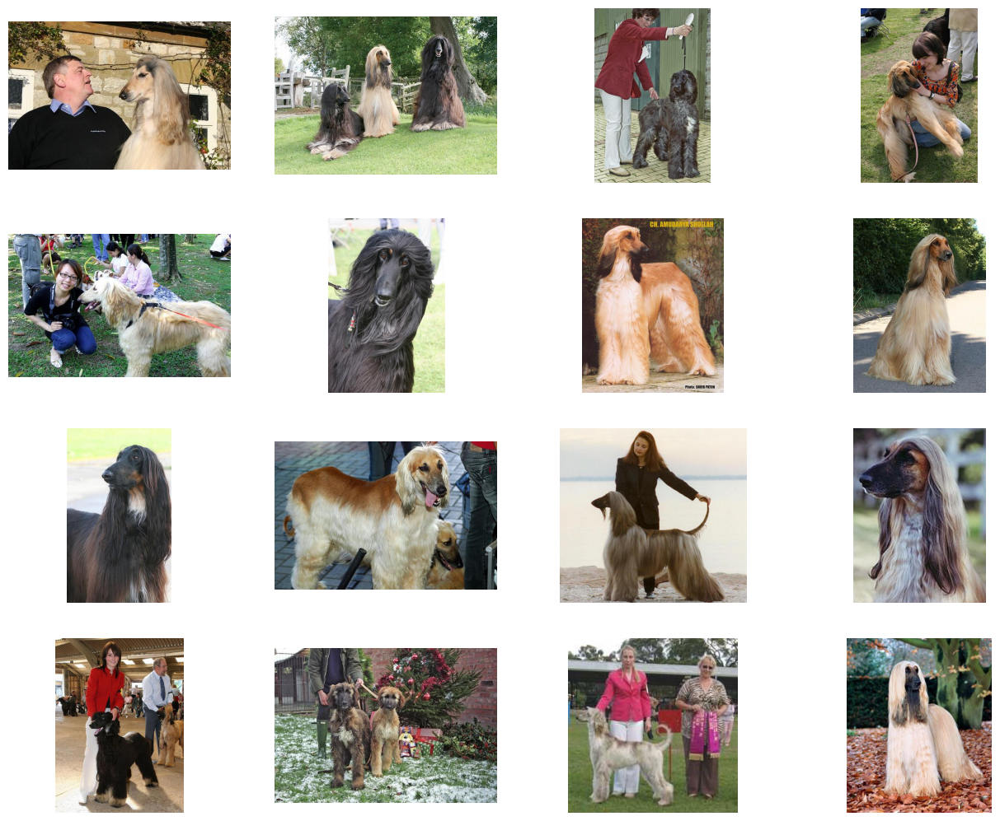

In [5]:
print(breed_list[0])
show_dir_images(breed_list[0], 16)

## Test and Train

In [6]:
#first crop the images to avoid the noise
def crop_image(breed, dog, data_dir):
  img = plt.imread(data_dir + 'images/Images/' + breed + '/' + dog + '.jpg')
  tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + dog)
  xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
  xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
  ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
  ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
  img = img[ymin:ymax, xmin:xmax, :]
  return img

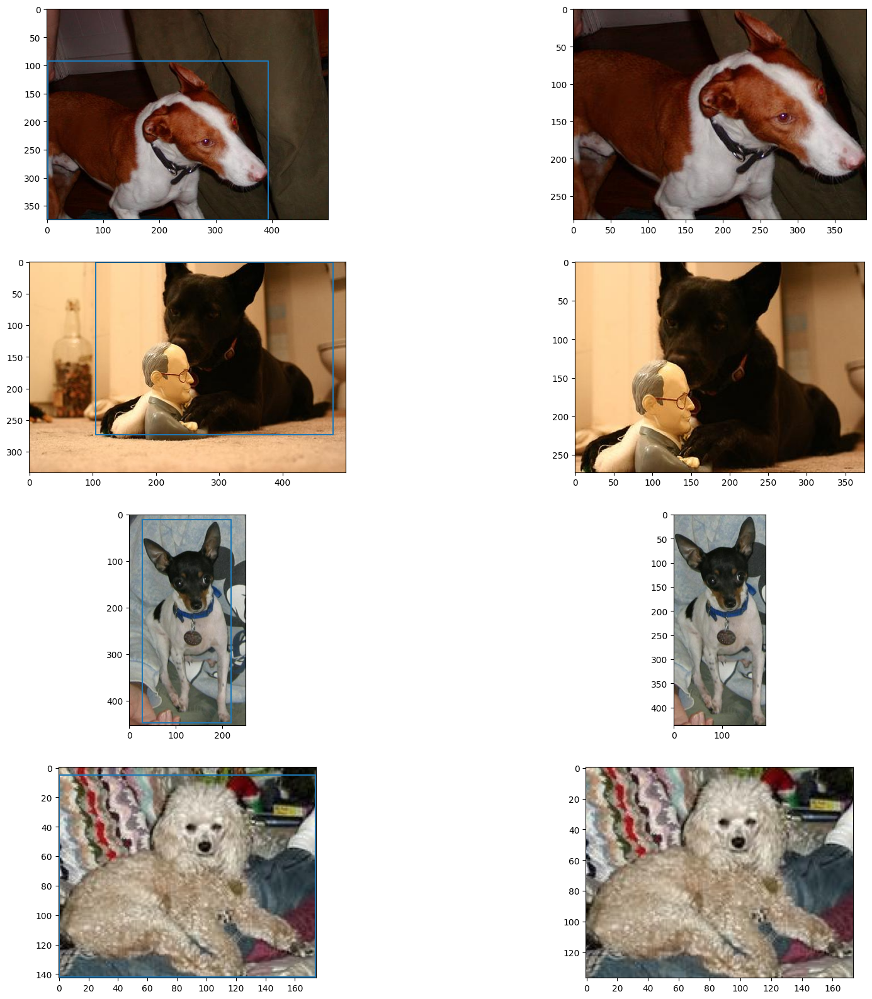

In [7]:
data_dir = '../input/stanford-dogs-dataset/'
# breed_list = os.listdir(data_dir + 'images/Images/') # already sorted the list before

plt.figure(figsize=(20, 20))
for i in range(4):
  plt.subplot(421 + (i*2))
  breed = np.random.choice(breed_list)
  dog = np.random.choice(os.listdir(data_dir + 'annotations/Annotation/' + breed))
  img = plt.imread(data_dir + 'images/Images/' + breed + '/' + dog + '.jpg')
  plt.imshow(img)  
  
  tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + dog)
  xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
  xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
  ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
  ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
  plt.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin])
  crop_img = crop_image(breed, dog, data_dir)
  plt.subplot(422 + (i*2))
  plt.imshow(crop_img)

In [8]:
# Uncomment to create the data folder
if 'data' not in os.listdir():
    os.mkdir('data')
for breed in breed_list:
    os.mkdir('data/' + breed)
print('Created {} folders to store cropped images of the different breeds.'.format(len(os.listdir('data'))))


# Add cropped images to folders
for breed in os.listdir('data'):
    for file in os.listdir(data_dir + 'annotations/Annotation/' + breed):
        img = Image.open(data_dir + 'images/Images/' + breed + '/' + file + '.jpg')
        tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + file)
        xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
        xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
        ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
        ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
        img = img.crop((xmin,ymin,xmax,ymax))
        img = img.convert('RGB')
        img.save('data/' + breed + '/' + file + '.jpg')
        
        
img_count = 0
for folder in os.listdir('data'):
    for _ in os.listdir('data/' + folder):
        img_count += 1
print('No. of Images: {}'.format(img_count))

Created 120 folders to store cropped images of the different breeds.

No. of Images: 20580


In [9]:
# Import data and create train, dev, test set

# Set your data directory
data_dir = 'data'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Assuming images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

# Use train_test_split to split the dataset into train, validation, and test sets
train_paths, val_test_paths, train_labels, val_test_labels = train_test_split(
    all_image_paths, all_image_labels, test_size=0.2, random_state=42)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    val_test_paths, val_test_labels, test_size=0.5, random_state=42)


train_labels_df = pd.DataFrame(train_labels, columns=['label'])
val_labels_df = pd.DataFrame(val_labels, columns=['label'])
test_labels_df = pd.DataFrame(test_labels, columns=['label'])

# Create a list of unique class names
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}

# Convert labels to integer labels using the dictionary
train_labels = [class_to_index[label] for label in train_labels]
val_labels = [class_to_index[label] for label in val_labels]
test_labels = [class_to_index[label] for label in test_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
train_labels = [boolean_encode(label, num_classes) for label in train_labels]
val_labels = [boolean_encode(label, num_classes) for label in val_labels]
test_labels = [boolean_encode(label, num_classes) for label in test_labels]

# Combine images and labels into datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_paths, test_labels))

# Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
train_dataset = train_dataset.map(load_and_preprocess_image)
val_dataset = val_dataset.map(load_and_preprocess_image)
test_dataset = test_dataset.map(load_and_preprocess_image)
print(len(train_dataset), len(val_dataset), len(test_dataset))

# Shuffle and batch the datasets
batch_size = 64
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

16464 2058 2058


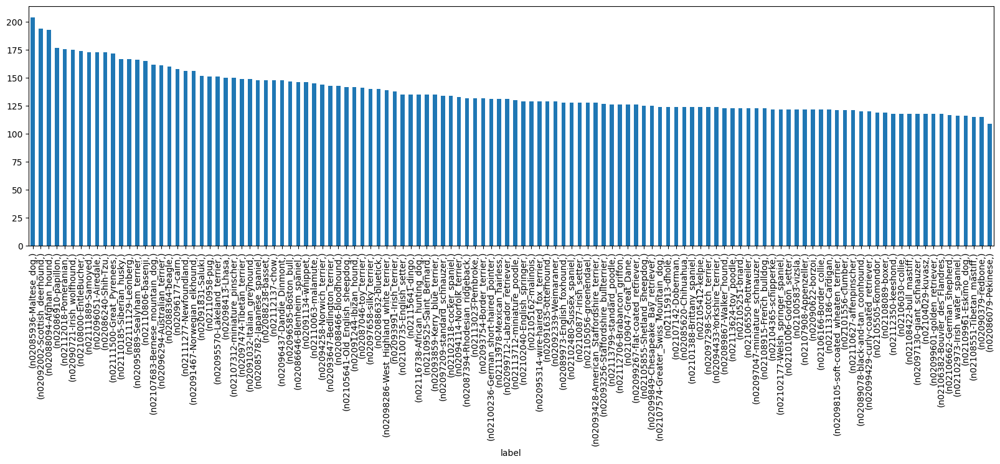

In [10]:
train_labels_df.value_counts().plot.bar(figsize=(20, 5));

In [11]:
#count how many pictures there are in each dog breed category
breeds = os.listdir("../input/stanford-dogs-dataset/images/Images/")

breed_counts = {}

# Loop through each breed directory and count the number of images
for breed in breed_list:
    breed_path = os.path.join("../input/stanford-dogs-dataset/images/Images/", breed)
    if os.path.isdir(breed_path):
        num_images = len([f for f in os.listdir(breed_path) if os.path.isfile(os.path.join(breed_path, f))])
        breed_counts[breed] = num_images
        print(f"{breed}: {num_images} images")

# Display total count for each breed
for breed, count in breed_counts.items():
    print(f"{breed}: {count} images in total")


n02088094-Afghan_hound: 239 images

n02116738-African_hunting_dog: 169 images

n02096051-Airedale: 202 images

n02093428-American_Staffordshire_terrier: 164 images

n02107908-Appenzeller: 151 images

n02096294-Australian_terrier: 196 images

n02093647-Bedlington_terrier: 182 images

n02107683-Bernese_mountain_dog: 218 images

n02086646-Blenheim_spaniel: 188 images

n02106166-Border_collie: 150 images

n02093754-Border_terrier: 172 images

n02096585-Boston_bull: 182 images

n02106382-Bouvier_des_Flandres: 150 images

n02112706-Brabancon_griffon: 153 images

n02101388-Brittany_spaniel: 152 images

n02113186-Cardigan: 155 images

n02099849-Chesapeake_Bay_retriever: 167 images

n02085620-Chihuahua: 152 images

n02096437-Dandie_Dinmont: 180 images

n02107142-Doberman: 150 images

n02089973-English_foxhound: 157 images

n02100735-English_setter: 161 images

n02102040-English_springer: 159 images

n02108000-EntleBucher: 202 images

n02109961-Eskimo_dog: 150 images

n02108915-French_bulldog: 1

In [12]:
# the same result as above but much simpler code:
with pd.option_context("display.max_rows", 1000):
    print(train_labels_df.value_counts())

label                                   

n02085936-Maltese_dog                       204

n02092002-Scottish_deerhound                194

n02088094-Afghan_hound                      193

n02086910-papillon                          177

n02112018-Pomeranian                        176

n02090721-Irish_wolfhound                   175

n02108000-EntleBucher                       174

n02111889-Samoyed                           173

n02096051-Airedale                          173

n02086240-Shih-Tzu                          173

n02111500-Great_Pyrenees                    172

n02110185-Siberian_husky                    167

n02111129-Leonberg                          167

n02095889-Sealyham_terrier                  166

n02110806-basenji                           165

n02107683-Bernese_mountain_dog              162

n02096294-Australian_terrier                161

n02088364-beagle                            160

n02096177-cairn                             158

n02111277-Newfoundland     

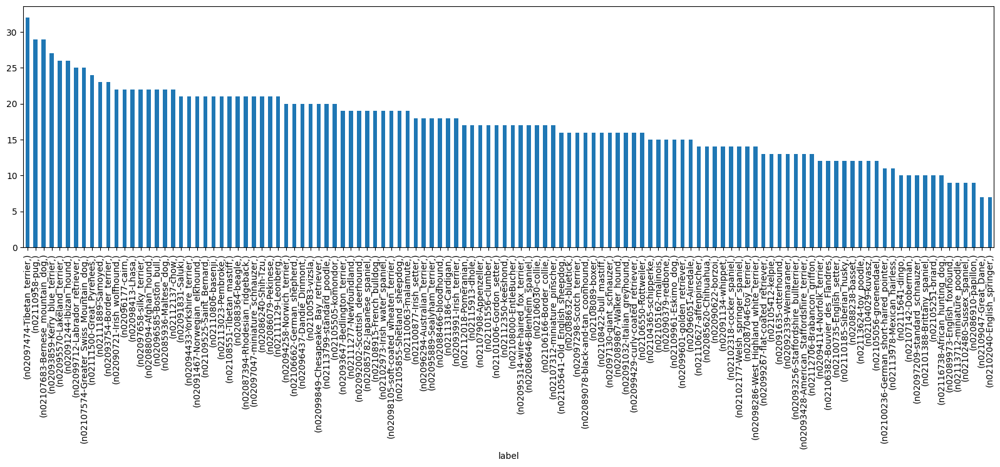

In [13]:
val_labels_df.value_counts().plot.bar(figsize=(20, 5));

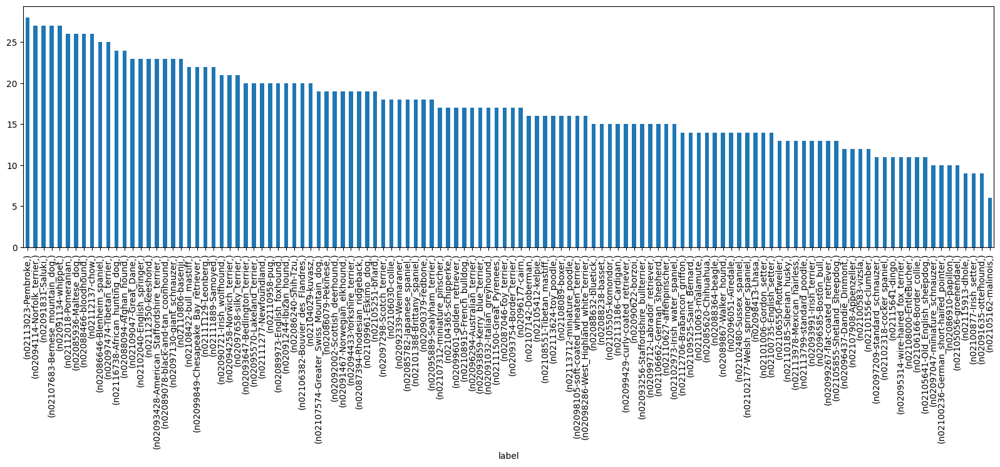

In [14]:
test_labels_df.value_counts().plot.bar(figsize=(20, 5));

In [15]:
# print(class_to_index)

# Take one sample from the train_dataset
single_item = train_dataset.take(1)

# Iterate through the single item to see its structure (image, label)
for image, label in single_item:
    print("Image shape:", image.shape)
    print("Label shape:", label)  # This will show the shape of the boolean-encoded label
    # You can also print or visualize the image and label content here if needed

Image shape: (64, 224, 224, 3)

Label shape: tf.Tensor(

[[0. 0. 0. ... 0. 0. 0.]

 [0. 0. 0. ... 0. 0. 0.]

 [1. 0. 0. ... 0. 0. 0.]

 ...

 [0. 0. 0. ... 1. 0. 0.]

 [0. 0. 0. ... 0. 0. 0.]

 [0. 0. 0. ... 0. 0. 0.]], shape=(64, 120), dtype=float32)


# Function for plotting the results

In [16]:
def plot_results(history, epochs):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend()
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

# Augmentation before modelling

In [17]:
# Function to save images to respective class folders based on class names
def save_images_to_folders(dataset, output_dir, class_to_index):
    for images, labels in dataset:
        for img, label in zip(images, labels):
            class_index = tf.argmax(label).numpy()
            class_name = [class_name for class_name, index in class_to_index.items() if index == class_index][0]
            class_dir = os.path.join(output_dir, class_name)

            if not os.path.exists(class_dir):
                os.makedirs(class_dir)

            img_name = f"image_{class_index}_{len(os.listdir(class_dir))}.jpg"
            img_path = os.path.join(class_dir, img_name)

            img = tf.clip_by_value(img, 0.0, 1.0) * 255.0  # Scale to [0, 255]
            img = tf.cast(img, tf.uint8)  # Convert to uint8
            tf.keras.preprocessing.image.save_img(img_path, img)

# Example usage
output_directory = "/kaggle/working/training_images"
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Assuming train_dataset is your prefetch batch dataset
save_images_to_folders(train_dataset, output_directory, class_to_index)

In [18]:
# # THIS CODE DELETES THE AUGMENTED IMAGES FOLDER, SO YOU CAN RERUN THE AUGMENTATIONS AND GET DIFFERENT RESULTS

# def remove_folder_contents(folder):
#     for the_file in os.listdir(folder):
#         file_path = os.path.join(folder, the_file)
#         try:
#             if os.path.isfile(file_path):
#                 os.unlink(file_path)
#             elif os.path.isdir(file_path):
#                 remove_folder_contents(file_path)
#                 os.rmdir(file_path)
#         except Exception as e:
#             print(e)

# folder_path = '/kaggle/working/augmented_images'
# remove_folder_contents(folder_path)
# os.rmdir(folder_path)

In [19]:
# Function to copy directory structure
def copy_directory_structure(src, dst):
    os.makedirs(dst, exist_ok=True)
    for item in os.listdir(src):
        s = os.path.join(src, item)
        d = os.path.join(dst, item)
        if os.path.isdir(s):
            shutil.copytree(s, d, symlinks=True)
        else:
            shutil.copy2(s, d)

# Function to augment and copy images
def augment_and_copy_images(input_dir, output_dir, num_images_per_class=500):
    copy_directory_structure(input_dir, output_dir)

    class_folders = os.listdir(input_dir)

    for class_folder in class_folders:
        class_path_input = os.path.join(input_dir, class_folder)
        class_path_output = os.path.join(output_dir, class_folder)

        images_list = os.listdir(class_path_input)
        augment_count = len(images_list)

        while augment_count < num_images_per_class:
            random_image_name = random.choice(images_list)
            image_path = os.path.join(class_path_input, random_image_name)

            # Read the image using TensorFlow
            image = tf.io.read_file(image_path)
            image = tf.image.decode_image(image)
            image = tf.image.convert_image_dtype(image, tf.float32)  # Convert to float32

            # Apply data augmentation
            augmented_image = data_augmentation(tf.expand_dims(image, 0))[0]
            augmented_image = tf.clip_by_value(augmented_image, 0.0, 1.0)
            augmented_image = tf.cast(augmented_image * 255.0, tf.uint8)  # Convert back to uint8

            # Save augmented image
            augment_count += 1
            augmented_img_path = os.path.join(class_path_output, f"{class_folder}_{augment_count}.jpg")
            tf.io.write_file(augmented_img_path, tf.io.encode_jpeg(augmented_image).numpy())

# Example usage
input_directory = '/kaggle/working/training_images'
output_directory = '/kaggle/working/augmented_images'

# Define a function to add Gaussian noise to an image
def add_gaussian_noise(image, max_sigma=0.1):
    sigma = tf.random.uniform(shape=[], minval=0.0, maxval=max_sigma)
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=sigma, dtype=tf.float32)
    noisy_image = tf.clip_by_value(image + noise, 0.0, 1.0)  # Clip values to [0, 1] range
    return noisy_image

# Define a function to apply random brightness to an image
def random_brightness(image, max_delta=0.5):
    delta = tf.random.uniform(shape=[], minval=-max_delta, maxval=max_delta)
    brightened_image = tf.image.adjust_brightness(image, delta)
    return brightened_image

# Define your existing data augmentation pipeline with additional noise
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),  # Increased rotation
    layers.RandomContrast(0.3),  # Increased contrast
    layers.Lambda(lambda x: tf.image.adjust_saturation(x, 2.0)),
    layers.Lambda(lambda x: random_brightness(x, max_delta=0.3)),  # Increased random brightness
    layers.Lambda(lambda x: add_gaussian_noise(x, max_sigma=0.2))  # Increased Gaussian noise
])

augment_and_copy_images(input_directory, output_directory)

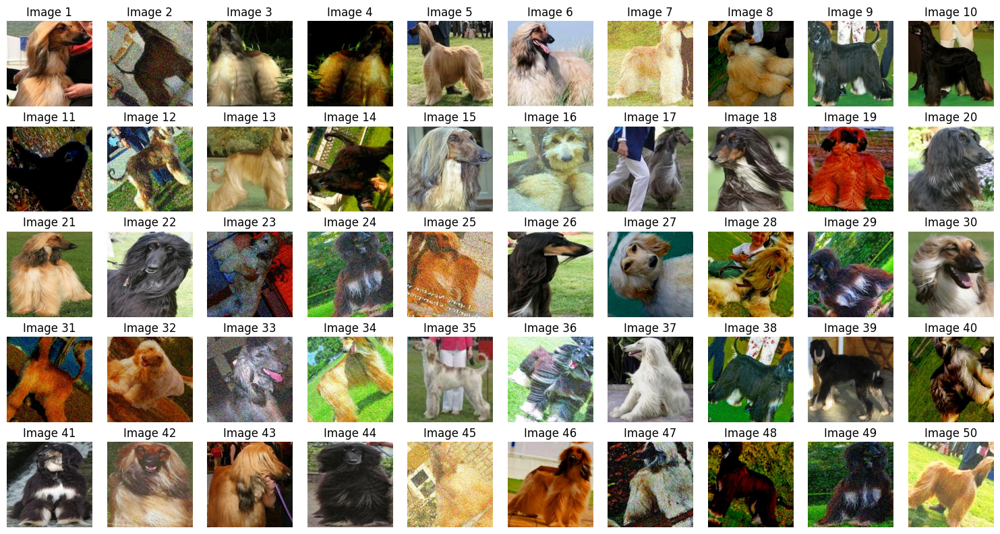

In [20]:
def visualize_images_in_folder(folder_path, num_images=50, columns=10):
    # List all files in the folder
    image_files = os.listdir(folder_path)
    
    # Select a subset of images to visualize
    selected_images = image_files[:num_images]
    
    num_rows = (num_images + columns - 1) // columns
    plt.figure(figsize=(15, 8))

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        
        # Open the image using PIL (Python Imaging Library)
        image = Image.open(image_path)
        
        plt.subplot(num_rows, columns, i+1)
        plt.imshow(image)
        plt.title(f"Image {i+1}")
        plt.axis('off')  # Hide axis

    plt.tight_layout()
    plt.show()

# Specify the folder path containing images
folder_path = '/kaggle/working/augmented_images/n02088094-Afghan_hound'  # Replace this with your folder path
visualize_images_in_folder(folder_path)

In [21]:
# Recommended to use a training dataset with 224 x 224 dimensions for first time so that you can resize the pictures afterwards in any size you want
# Set your data directory
data_dir = 'augmented_images'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Augmented images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

    
augmented_train_labels_df = pd.DataFrame(all_image_labels, columns=['label'])
    
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}
    
# Convert labels to integer labels using the dictionary
augmented_train_labels = [class_to_index[label] for label in all_image_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
augmented_train_labels = [boolean_encode(label, num_classes) for label in augmented_train_labels]

# Combine images and labels into datasets
augmented_train_dataset = tf.data.Dataset.from_tensor_slices((all_image_paths, augmented_train_labels))

#Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
augmented_train_dataset = augmented_train_dataset.map(load_and_preprocess_image)

print(len(augmented_train_dataset))

# Shuffle and batch the datasets
batch_size = 128 # Increased from 64
augmented_train_dataset = augmented_train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

60000


In [22]:
augmented_train_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

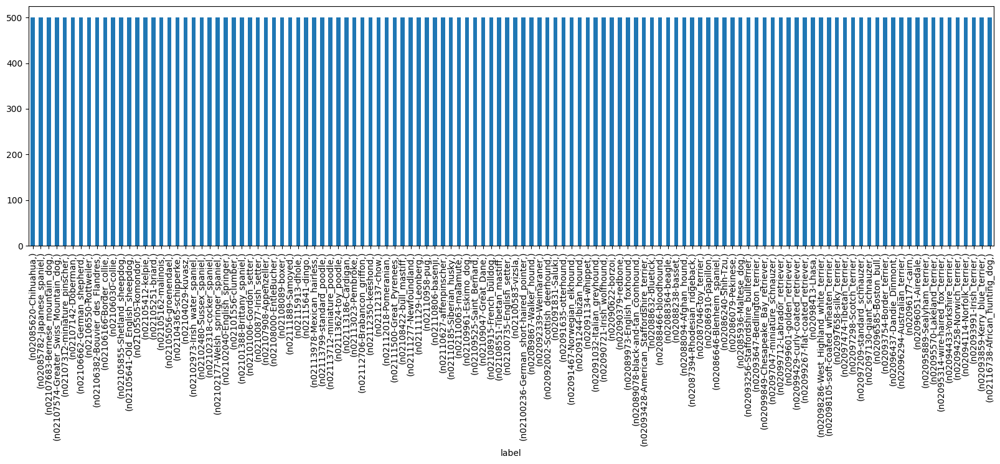

In [23]:
augmented_train_labels_df.value_counts().plot.bar(figsize=(20, 5));

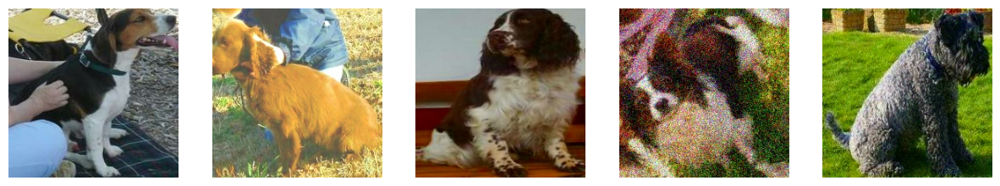

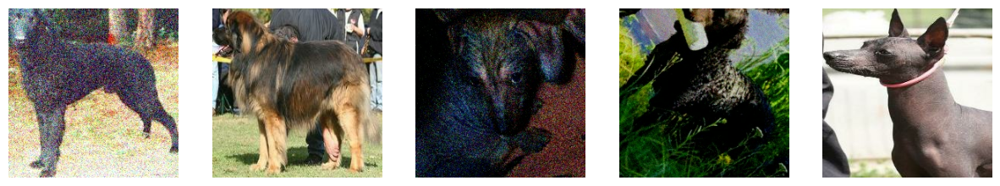

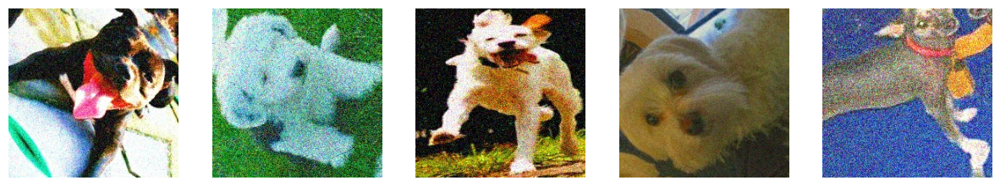

In [24]:
def display_augmentations(image_index, num_times, data):
    images_to_display = []
    
    # Access the repeated images from the dataset
    repeated_images = data.map(lambda x, y: x)
    
    plt.figure(figsize=(15, 5))
    for i, img in enumerate(repeated_images):
        if i == num_times:  # Stop after displaying the required number of images
            break
        image_np = img[image_index].numpy()  # Extract the image as a NumPy array
        image_np = np.clip(image_np, 0, 1)  # Clip values to [0, 1] range
        images_to_display.append(image_np)

    for i in range(num_times):
        plt.subplot(1, num_times, i + 1)
        plt.imshow(images_to_display[i])
        plt.axis('off')

    plt.show()
    return

    
# Display the same image multiple times next to each other
display_augmentations(0, 5, augmented_train_dataset)
display_augmentations(0, 5, augmented_train_dataset)
display_augmentations(0, 5, augmented_train_dataset)

# Simple Models (64*64)

In [25]:
# Import data and create train, dev, test set

# Set your data directory
data_dir = 'data'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Assuming images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

# Use train_test_split to split the dataset into train, validation, and test sets
train_paths, val_test_paths, train_labels, val_test_labels = train_test_split(
    all_image_paths, all_image_labels, test_size=0.2, random_state=42)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    val_test_paths, val_test_labels, test_size=0.5, random_state=42)


train_labels_df = pd.DataFrame(train_labels, columns=['label'])
val_labels_df = pd.DataFrame(val_labels, columns=['label'])
test_labels_df = pd.DataFrame(test_labels, columns=['label'])

# Create a list of unique class names
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}

# Convert labels to integer labels using the dictionary
train_labels = [class_to_index[label] for label in train_labels]
val_labels = [class_to_index[label] for label in val_labels]
test_labels = [class_to_index[label] for label in test_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
train_labels = [boolean_encode(label, num_classes) for label in train_labels]
val_labels = [boolean_encode(label, num_classes) for label in val_labels]
test_labels = [boolean_encode(label, num_classes) for label in test_labels]

# Combine images and labels into datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_paths, test_labels))

# Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [64, 64])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
train_dataset = train_dataset.map(load_and_preprocess_image)
val_dataset = val_dataset.map(load_and_preprocess_image)
test_dataset = test_dataset.map(load_and_preprocess_image)
print(len(train_dataset), len(val_dataset), len(test_dataset))

# Shuffle and batch the datasets
batch_size = 64
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

16464 2058 2058


In [26]:
# Recommended to use a training dataset with 224 x 224 dimensions for first time so that you can resize the pictures afterwards in any size you want
# Set your data directory
data_dir = 'augmented_images'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Augmented images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

    
augmented_train_labels_df = pd.DataFrame(all_image_labels, columns=['label'])
    
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}
    
# Convert labels to integer labels using the dictionary
augmented_train_labels = [class_to_index[label] for label in all_image_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
augmented_train_labels = [boolean_encode(label, num_classes) for label in augmented_train_labels]

# Combine images and labels into datasets
augmented_train_dataset = tf.data.Dataset.from_tensor_slices((all_image_paths, augmented_train_labels))

#Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [64, 64])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
augmented_train_dataset = augmented_train_dataset.map(load_and_preprocess_image)

print(len(augmented_train_dataset))

# Shuffle and batch the datasets
batch_size = 128 # Increased from 64
augmented_train_dataset = augmented_train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

60000


# Simple CNN model

In [27]:
# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define your model architecture
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same',input_shape=(64, 64, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.3))
model.add(layers.Dense(120, activation='softmax'))  

optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

Epoch 1/50


2023-12-27 10:49:33.211923: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 19s 25ms/step - loss: 4.7899 - accuracy: 0.0094 - val_loss: 4.8275 - val_accuracy: 0.0107

Epoch 2/50

258/258 [==============================] - 9s 22ms/step - loss: 4.9026 - accuracy: 0.0198 - val_loss: 5.1038 - val_accuracy: 0.0301

Epoch 3/50

258/258 [==============================] - 9s 23ms/step - loss: 4.7831 - accuracy: 0.0316 - val_loss: 6.6663 - val_accuracy: 0.0190

Epoch 4/50

258/258 [==============================] - 9s 23ms/step - loss: 4.7544 - accuracy: 0.0391 - val_loss: 5.2037 - val_accuracy: 0.0534

Epoch 5/50

258/258 [==============================] - 9s 23ms/step - loss: 4.9496 - accuracy: 0.0517 - val_loss: 5.5291 - val_accuracy: 0.0646

Epoch 6/50

258/258 [==============================] - 9s 23ms/step - loss: 4.4753 - accuracy: 0.0593 - val_loss: 5.0592 - val_accuracy: 0.0729


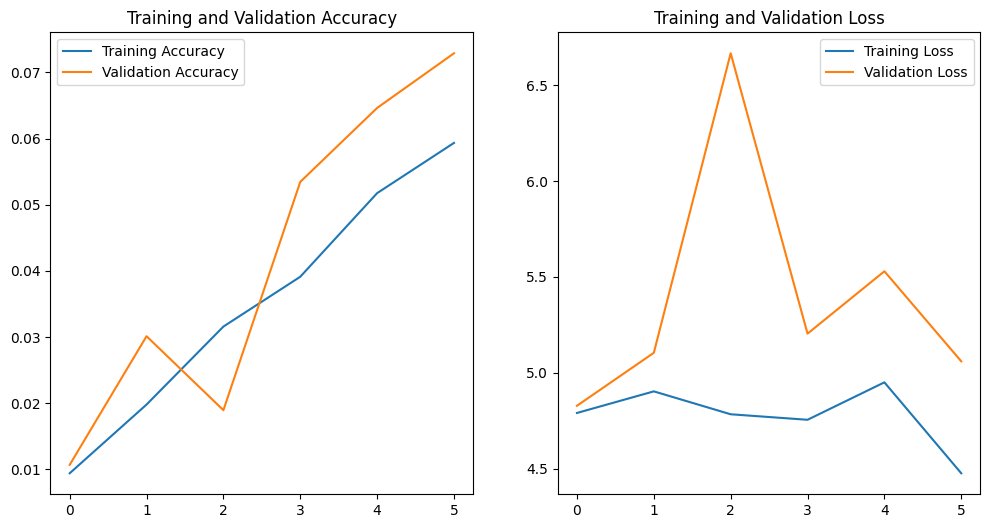

Training accuracy: 0.0593

Validation accuracy: 0.0729

33/33 [==============================] - 1s 16ms/step - loss: 4.8281 - accuracy: 0.0102

Test accuracy: 0.0102


In [28]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")

# Simple CNN with Augmentation

In [29]:
# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define your model architecture
model = models.Sequential()
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same',input_shape=(64, 64, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.3))
model.add(layers.Dense(120, activation='softmax'))  

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(augmented_train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

Epoch 1/50


2023-12-27 10:50:40.620764: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_5/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


469/469 [==============================] - 25s 42ms/step - loss: 4.4376 - accuracy: 0.0317 - val_loss: 5.2797 - val_accuracy: 0.0063

Epoch 2/50

469/469 [==============================] - 22s 41ms/step - loss: 4.0365 - accuracy: 0.0458 - val_loss: 5.5688 - val_accuracy: 0.0228

Epoch 3/50

469/469 [==============================] - 21s 40ms/step - loss: 3.9345 - accuracy: 0.0589 - val_loss: 6.4717 - val_accuracy: 0.0238

Epoch 4/50

469/469 [==============================] - 22s 41ms/step - loss: 3.9136 - accuracy: 0.0549 - val_loss: 10.8886 - val_accuracy: 0.0214

Epoch 5/50

469/469 [==============================] - 22s 41ms/step - loss: 3.9011 - accuracy: 0.0583 - val_loss: 8.9716 - val_accuracy: 0.0170

Epoch 6/50

469/469 [==============================] - 21s 40ms/step - loss: 3.8146 - accuracy: 0.0725 - val_loss: 8.4687 - val_accuracy: 0.0238


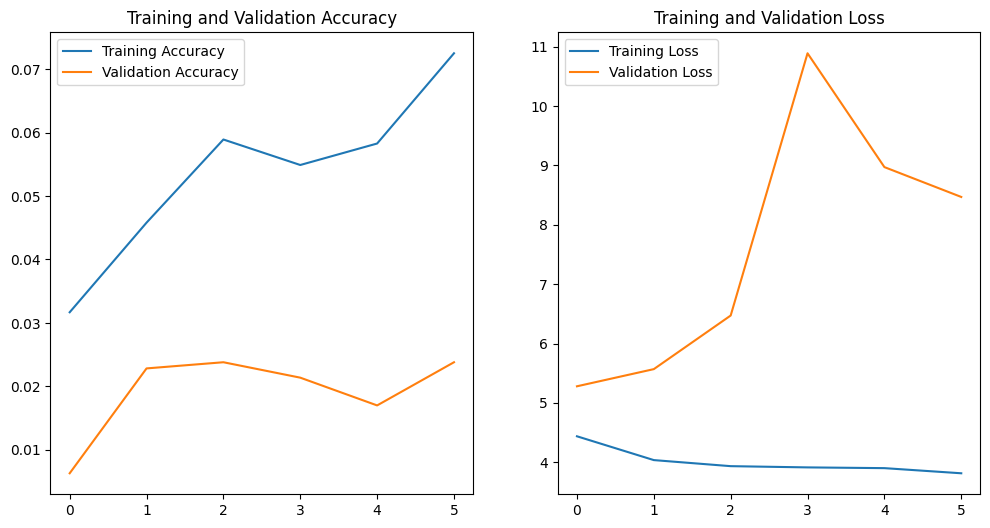

Training accuracy: 0.0725

Validation accuracy: 0.0238

33/33 [==============================] - 1s 16ms/step - loss: 5.3189 - accuracy: 0.0087

Test accuracy: 0.0087


In [30]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Simple CNN with leaky Relu

In [31]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), padding='same', input_shape=(64, 64, 3)))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Flatten())
model.add(layers.Dense(128))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset,  epochs=10)

Epoch 1/10


2023-12-27 10:52:57.658871: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_10/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 12s 21ms/step - loss: 4.5402 - accuracy: 0.0426 - val_loss: 5.6592 - val_accuracy: 0.0112

Epoch 2/10

258/258 [==============================] - 8s 20ms/step - loss: 3.9882 - accuracy: 0.0963 - val_loss: 3.9957 - val_accuracy: 0.0826

Epoch 3/10

258/258 [==============================] - 8s 20ms/step - loss: 3.6687 - accuracy: 0.1392 - val_loss: 3.6777 - val_accuracy: 0.1297

Epoch 4/10

258/258 [==============================] - 8s 21ms/step - loss: 3.3903 - accuracy: 0.1856 - val_loss: 3.4961 - val_accuracy: 0.1545

Epoch 5/10

258/258 [==============================] - 8s 19ms/step - loss: 3.1484 - accuracy: 0.2299 - val_loss: 3.3569 - val_accuracy: 0.1929

Epoch 6/10

258/258 [==============================] - 8s 19ms/step - loss: 2.9255 - accuracy: 0.2741 - val_loss: 3.4351 - val_accuracy: 0.1837

Epoch 7/10

258/258 [==============================] - 8s 19ms/step - loss: 2.6992 - accuracy: 0.3158 - val_loss: 3.2501 - val_accuracy: 0.20

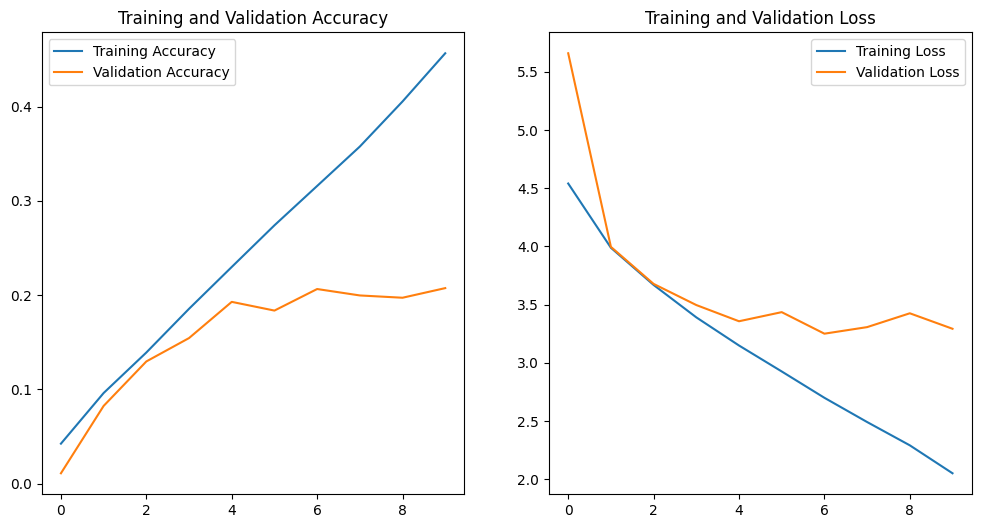

Training accuracy: 0.4565

Validation accuracy: 0.2075

33/33 [==============================] - 1s 16ms/step - loss: 3.2652 - accuracy: 0.2157

Test accuracy: 0.2157


In [32]:
# Plot the training results
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")

# Simple CNN with leaky Relu with early stopping

In [33]:
# Define the model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), padding='same', input_shape=(64, 64, 3)))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), padding='same'))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))

model.add(layers.Flatten())
model.add(layers.Dense(128))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define EarlyStopping callback
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])


Epoch 1/50


2023-12-27 10:54:24.316298: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_4/dropout_12/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 12s 21ms/step - loss: 4.5646 - accuracy: 0.0421 - val_loss: 5.0468 - val_accuracy: 0.0170

Epoch 2/50

258/258 [==============================] - 8s 19ms/step - loss: 3.9827 - accuracy: 0.0910 - val_loss: 4.0613 - val_accuracy: 0.0748

Epoch 3/50

258/258 [==============================] - 8s 19ms/step - loss: 3.6874 - accuracy: 0.1384 - val_loss: 3.7695 - val_accuracy: 0.1220

Epoch 4/50

258/258 [==============================] - 8s 20ms/step - loss: 3.4271 - accuracy: 0.1804 - val_loss: 3.5580 - val_accuracy: 0.1647

Epoch 5/50

258/258 [==============================] - 8s 21ms/step - loss: 3.1769 - accuracy: 0.2238 - val_loss: 4.0191 - val_accuracy: 0.1200

Epoch 6/50

258/258 [==============================] - 8s 20ms/step - loss: 2.9446 - accuracy: 0.2717 - val_loss: 3.9882 - val_accuracy: 0.1346

Epoch 7/50

258/258 [==============================] - 8s 19ms/step - loss: 2.7396 - accuracy: 0.3046 - val_loss: 3.4055 - val_accuracy: 0.18

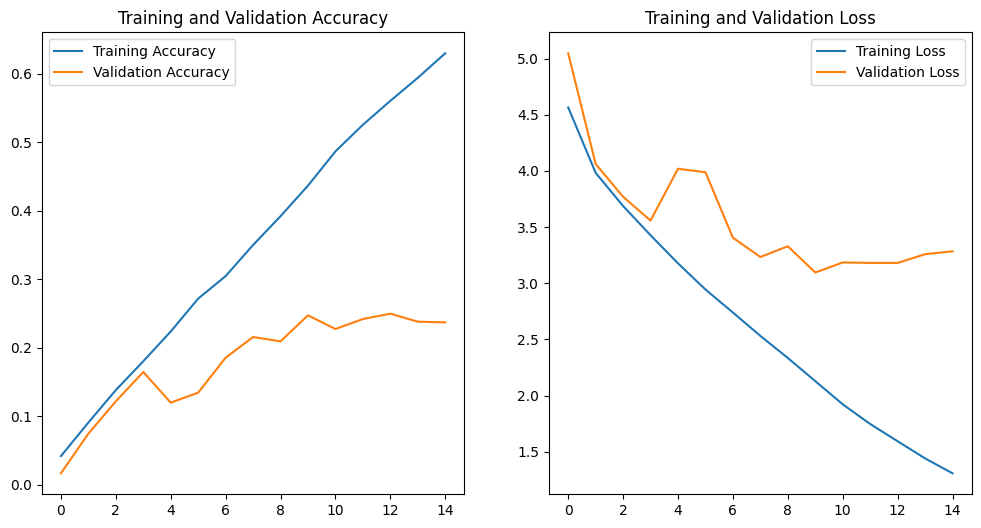

Training accuracy: 0.6296

Validation accuracy: 0.2371

33/33 [==============================] - 1s 18ms/step - loss: 3.1038 - accuracy: 0.2561

Test accuracy: 0.2561


In [34]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")

# Simple ResNet

In [35]:
# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the residual block function
def residual_block(x, filters, kernel_size=3, stride=1):
    fx = x
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, fx])
    x = layers.ReLU()(x)
    return x

# CNN model with the residual connections
def create_resnet_model():
    inputs = layers.Input(shape=(64, 64, 3))
    x = inputs
    x = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(x)
    x = residual_block(x, 32)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(x)
    x = residual_block(x, 64)
    x = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(x)
    x = residual_block(x, 128)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(120, activation='softmax')(x)
    model = models.Model(inputs, outputs)
    return model

# Create and compile the ResNet model
resnet_model = create_resnet_model()
resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with early stopping
history = resnet_model.fit(train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

Epoch 1/50


2023-12-27 10:56:32.637801: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout_14/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 22s 50ms/step - loss: 5.6604 - accuracy: 0.0104 - val_loss: 4.9156 - val_accuracy: 0.0121

Epoch 2/50

258/258 [==============================] - 15s 47ms/step - loss: 4.8276 - accuracy: 0.0174 - val_loss: 4.7893 - val_accuracy: 0.0204

Epoch 3/50

258/258 [==============================] - 15s 47ms/step - loss: 4.6670 - accuracy: 0.0253 - val_loss: 4.6395 - val_accuracy: 0.0335

Epoch 4/50

258/258 [==============================] - 15s 48ms/step - loss: 4.5335 - accuracy: 0.0312 - val_loss: 4.6291 - val_accuracy: 0.0253

Epoch 5/50

258/258 [==============================] - 16s 47ms/step - loss: 4.4050 - accuracy: 0.0417 - val_loss: 4.4349 - val_accuracy: 0.0471

Epoch 6/50

258/258 [==============================] - 15s 47ms/step - loss: 4.3115 - accuracy: 0.0467 - val_loss: 4.4784 - val_accuracy: 0.0408

Epoch 7/50

258/258 [==============================] - 15s 47ms/step - loss: 4.2304 - accuracy: 0.0568 - val_loss: 4.3054 - val_accuracy

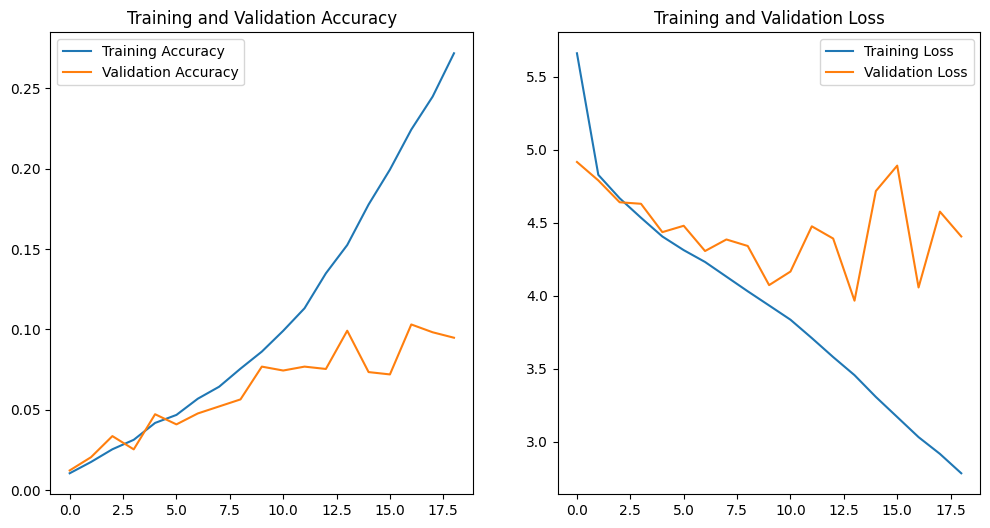

Training accuracy: 0.2718

Validation accuracy: 0.0948

33/33 [==============================] - 1s 17ms/step - loss: 3.9483 - accuracy: 0.1040

Test accuracy: 0.1040


In [36]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = resnet_model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Self attention

In [37]:
# pip install tensorflow tensorflow-addons

In [38]:
def CNNWithAttention():
    # Define your CNN layers
    inputs = layers.Input(shape=(64, 64, 3))  # Example input shape
    conv = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    # Add more convolutional layers as needed

    # Add self-attention mechanism
    attention = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv)
    multiplied = layers.multiply([conv, attention])
    
    # Global Average Pooling to aggregate features
    pooled = layers.GlobalAveragePooling2D()(multiplied)
    
    # Output layer for classification
    outputs = layers.Dense(num_classes, activation='softmax')(pooled)  # num_classes is the number of output classes
    
    # Create the model
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create an instance of the CNN model with attention
cnn_with_attention = CNNWithAttention()
cnn_with_attention.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#cnn_with_attention.summary()

# Train the model using the prepared datasets
history = cnn_with_attention.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10

258/258 [==============================] - 9s 19ms/step - loss: 4.7782 - accuracy: 0.0118 - val_loss: 4.7706 - val_accuracy: 0.0117

Epoch 2/10

258/258 [==============================] - 7s 16ms/step - loss: 4.7515 - accuracy: 0.0140 - val_loss: 4.7315 - val_accuracy: 0.0151

Epoch 3/10

258/258 [==============================] - 7s 16ms/step - loss: 4.6960 - accuracy: 0.0211 - val_loss: 4.6641 - val_accuracy: 0.0194

Epoch 4/10

258/258 [==============================] - 7s 16ms/step - loss: 4.6371 - accuracy: 0.0259 - val_loss: 4.6167 - val_accuracy: 0.0199

Epoch 5/10

258/258 [==============================] - 7s 16ms/step - loss: 4.6011 - accuracy: 0.0265 - val_loss: 4.5917 - val_accuracy: 0.0258

Epoch 6/10

258/258 [==============================] - 7s 17ms/step - loss: 4.5799 - accuracy: 0.0269 - val_loss: 4.5789 - val_accuracy: 0.0292

Epoch 7/10

258/258 [==============================] - 7s 16ms/step - loss: 4.5668 - accuracy: 0.0290 - val_loss: 4.5715 - val_acc

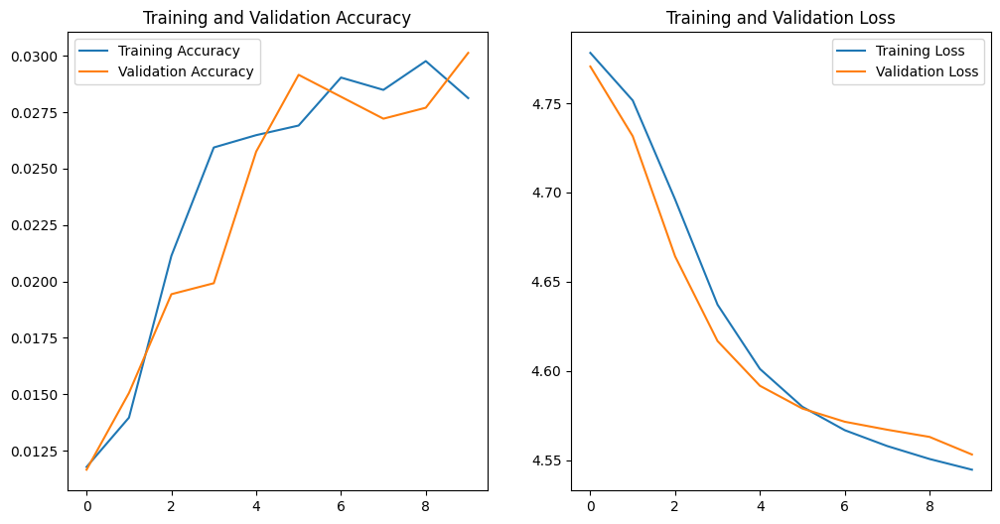

Training accuracy: 0.0281

Validation accuracy: 0.0301

33/33 [==============================] - 1s 16ms/step - loss: 4.5555 - accuracy: 0.0282

Test Loss: 4.5555

Test Accuracy: 0.0282


In [39]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = cnn_with_attention.evaluate(test_dataset)

# Print the results
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")



# Untrained VGG16

In [40]:
# input
input = Input(shape =(64,64,3)) # Originally (224,224,3)

# 1st Conv Block
x = Conv2D (filters =64, kernel_size =3, padding ='same', activation='relu')(input)
x = Conv2D (filters =64, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# 2nd Conv Block
x = Conv2D (filters =128, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =128, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# 3rd Conv block
x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# 4th Conv block
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# 5th Conv block
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# Fully connected layers
x = Flatten()(x)
x = Dense(256, activation ='relu')(x) # Originally 4096
x = Dense(256, activation ='relu')(x) # Originally 4096
output = Dense(120, activation ='softmax')(x)

# creating the model
model = Model (inputs=input, outputs =output)
model.summary()

Model: "model_2"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 input_3 (InputLayer)        [(None, 64, 64, 3)]       0         

                                                                 

 conv2d_23 (Conv2D)          (None, 64, 64, 64)        1792      

                                                                 

 conv2d_24 (Conv2D)          (None, 64, 64, 64)        36928     

                                                                 

 max_pooling2d_14 (MaxPooli  (None, 32, 32, 64)        0         

 ng2D)                                                           

                                                                 

 conv2d_25 (Conv2D)          (None, 32, 32, 128)       73856     

                                                                 

 conv2d_26 (Conv2D)          (None, 32, 32, 128)       147584    

                                           

Epoch 1/50

258/258 [==============================] - 22s 49ms/step - loss: 4.7959 - accuracy: 0.0111 - val_loss: 6.1986 - val_accuracy: 0.0092

Epoch 2/50

258/258 [==============================] - 15s 46ms/step - loss: 5.0665 - accuracy: 0.0115 - val_loss: 19.9621 - val_accuracy: 0.0092

Epoch 3/50

258/258 [==============================] - 15s 46ms/step - loss: 6.0239 - accuracy: 0.0128 - val_loss: 10.0202 - val_accuracy: 0.0107

Epoch 4/50

258/258 [==============================] - 15s 46ms/step - loss: 26.8449 - accuracy: 0.0116 - val_loss: 58.2408 - val_accuracy: 0.0092

Epoch 5/50

258/258 [==============================] - 15s 46ms/step - loss: 7.3220 - accuracy: 0.0117 - val_loss: 274.7131 - val_accuracy: 0.0107

Epoch 6/50

258/258 [==============================] - 15s 46ms/step - loss: 6.9072 - accuracy: 0.0110 - val_loss: 2876.7083 - val_accuracy: 0.0092


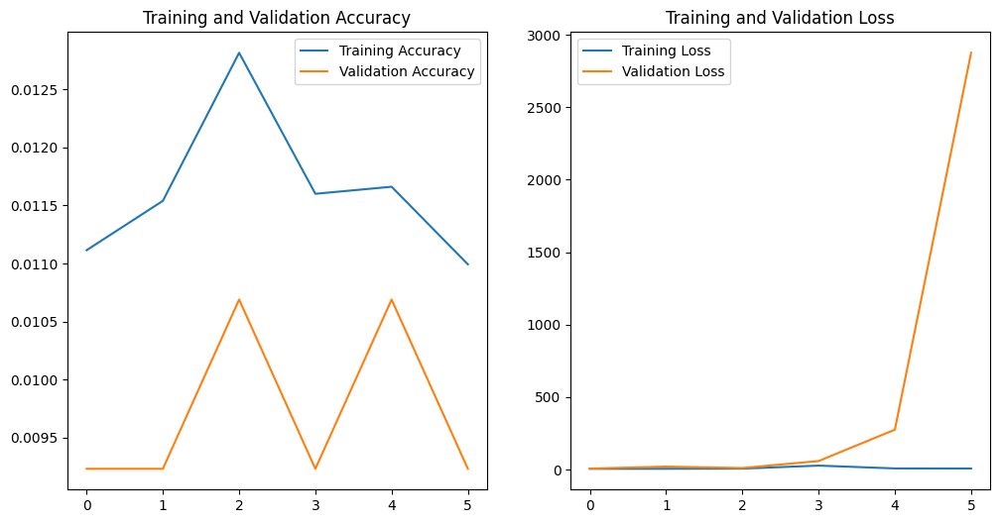

Training accuracy: 0.0110

Validation accuracy: 0.0092

33/33 [==============================] - 1s 17ms/step - loss: 6.0561 - accuracy: 0.0092

Test accuracy: 0.0092


In [41]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

plot_results(history, len(history.history['accuracy']))
# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")



# Self attention with VGG16

In [42]:
def CNNWithAttention_vgg16(num_classes):
    # Load pre-trained VGG16 model without top layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
    
    # Freeze VGG16 layers
    for layer in base_model.layers:
        layer.trainable = False
    
    # Extract features from VGG16
    vgg_features = base_model.output

    # Add self-attention mechanism
    attention = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(vgg_features)
    multiplied = layers.multiply([vgg_features, attention])

    # Global Average Pooling to aggregate features
    pooled = layers.GlobalAveragePooling2D()(multiplied)

    # Output layer for classification
    outputs = layers.Dense(num_classes, activation='softmax')(pooled)

    # Create the model
    model = Model(inputs=base_model.input, outputs=outputs)

    return model


model = CNNWithAttention_vgg16(120)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=10)


58889256/58889256 [==============================] - 0s 0us/step

Epoch 1/10

258/258 [==============================] - 10s 22ms/step - loss: 4.5846 - accuracy: 0.0408 - val_loss: 4.3139 - val_accuracy: 0.0875

Epoch 2/10

258/258 [==============================] - 8s 22ms/step - loss: 4.1106 - accuracy: 0.1093 - val_loss: 4.1501 - val_accuracy: 0.1074

Epoch 3/10

258/258 [==============================] - 8s 21ms/step - loss: 3.9166 - accuracy: 0.1403 - val_loss: 4.0433 - val_accuracy: 0.1273

Epoch 4/10

258/258 [==============================] - 8s 22ms/step - loss: 3.7874 - accuracy: 0.1569 - val_loss: 3.9917 - val_accuracy: 0.1293

Epoch 5/10

258/258 [==============================] - 8s 21ms/step - loss: 3.6882 - accuracy: 0.1716 - val_loss: 3.9326 - val_accuracy: 0.1351

Epoch 6/10

258/258 [==============================] - 8s 22ms/step - loss: 3.6097 - accuracy: 0.1861 - val_loss: 3.9090 - val_accuracy: 0.1404

Epoch 7/10

258/258 [==============================] - 8s 21ms

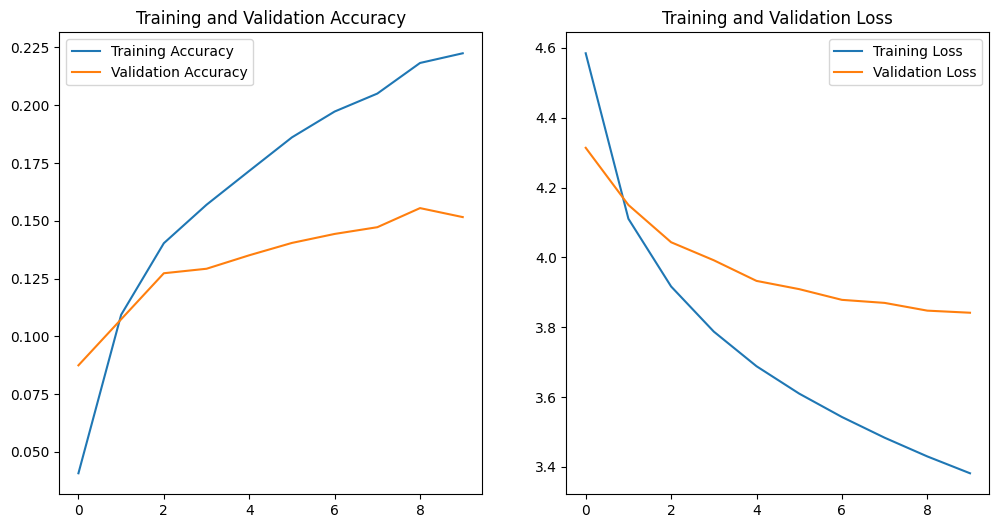

Training accuracy: 0.2225

Validation accuracy: 0.1516

33/33 [==============================] - 1s 17ms/step - loss: 3.8069 - accuracy: 0.1579

Test accuracy: 0.1579


In [43]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Untrained Resnet-50

In [44]:
INPUT_SHAPE = (64,64,3) # Originally (224,224,3)
NUMBER_OF_CLASSESS = 120

def conv_batchnorm_relu(x, filters, kernel_size, strides=1):
    x = Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

def identity_block(tensor, filters):
    x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=1)
    x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)
    x = Conv2D(filters=4*filters, kernel_size=1, strides=1)(x)
    x = BatchNormalization()(x)
    x = Add()([tensor,x]) # skip connection
    x = ReLU()(x)
    return x

def projection_block(tensor, filters, strides):
         
     #left stream     
     x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=strides)     
     x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)     
     x = Conv2D(filters=4*filters, kernel_size=1, strides=1)(x)     
     x = BatchNormalization()(x) 
         
     #right stream     
     shortcut = Conv2D(filters=4*filters, kernel_size=1, strides=strides)(tensor)     
     shortcut = BatchNormalization()(shortcut)          
     x = Add()([shortcut,x])    #skip connection     
     x = ReLU()(x)          
     return x 
    
def resnet_block(x, filters, reps, strides):
    
    x = projection_block(x, filters, strides)
    for _ in range(reps-1):
        x = identity_block(x,filters)
    return x 

input = Input(shape=INPUT_SHAPE)


x = conv_batchnorm_relu(input, filters=64, kernel_size=7, strides=2)
x = MaxPool2D(pool_size = 3, strides =2)(x)
x = resnet_block(x, filters=64, reps =3, strides=1)
x = resnet_block(x, filters=128, reps =4, strides=2)
x = resnet_block(x, filters=256, reps =6, strides=2)
x = resnet_block(x, filters=512, reps =3, strides=2)
x = GlobalAvgPool2D()(x)


output = Dense(NUMBER_OF_CLASSESS, activation ='softmax')(x)


model = Model(inputs=input, outputs=output)
model.summary()

Model: "model_4"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 input_5 (InputLayer)        [(None, 64, 64, 3)]          0         []                            

                                                                                                  

 conv2d_37 (Conv2D)          (None, 32, 32, 64)           9472      ['input_5[0][0]']             

                                                                                                  

 batch_normalization_14 (Ba  (None, 32, 32, 64)           256       ['conv2d_37[0][0]']           

 tchNormalization)                                                                                

                                                                                                  

 re_lu_6 (ReLU)              (None, 32, 32, 64)           0         ['batch_norma

Epoch 1/50

258/258 [==============================] - 58s 67ms/step - loss: 5.0310 - accuracy: 0.0291 - val_loss: 5.9506 - val_accuracy: 0.0117

Epoch 2/50

258/258 [==============================] - 17s 57ms/step - loss: 4.2604 - accuracy: 0.0646 - val_loss: 7.5238 - val_accuracy: 0.0311

Epoch 3/50

258/258 [==============================] - 18s 58ms/step - loss: 3.9228 - accuracy: 0.0999 - val_loss: 4.3575 - val_accuracy: 0.0802

Epoch 4/50

258/258 [==============================] - 18s 58ms/step - loss: 3.6247 - accuracy: 0.1401 - val_loss: 4.4952 - val_accuracy: 0.0986

Epoch 5/50

258/258 [==============================] - 18s 58ms/step - loss: 3.2835 - accuracy: 0.1950 - val_loss: 4.1340 - val_accuracy: 0.1220

Epoch 6/50

258/258 [==============================] - 18s 58ms/step - loss: 2.9495 - accuracy: 0.2605 - val_loss: 3.8792 - val_accuracy: 0.1278

Epoch 7/50

258/258 [==============================] - 18s 57ms/step - loss: 2.5730 - accuracy: 0.3261 - val_loss: 4.5438 - 

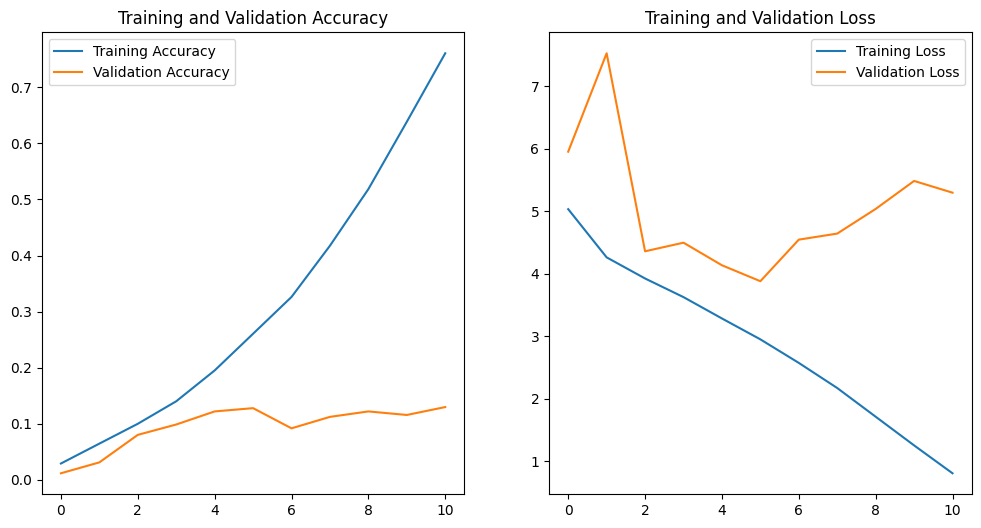

Training accuracy: 0.7606

Validation accuracy: 0.1297

33/33 [==============================] - 1s 24ms/step - loss: 3.9113 - accuracy: 0.1268

Test accuracy: 0.1268


In [45]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

plot_results(history, len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


## Models with Augmentation

In [46]:
# The exact same CNN model as before, but now it will run with the augmented dataset

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Define your model architecture
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same',input_shape=(64, 64, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))
# model.add(layers.Dense(128, activation='relu'))
# model.add(layers.Dropout(0.3))
model.add(layers.Dense(120, activation='softmax'))  

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_5"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 conv2d_90 (Conv2D)          (None, 64, 64, 32)        896       

                                                                 

 max_pooling2d_20 (MaxPooli  (None, 32, 32, 32)        0         

 ng2D)                                                           

                                                                 

 dropout_18 (Dropout)        (None, 32, 32, 32)        0         

                                                                 

 conv2d_91 (Conv2D)          (None, 32, 32, 64)        18496     

                                                                 

 max_pooling2d_21 (MaxPooli  (None, 16, 16, 64)        0         

 ng2D)                                                           

                                                                 

 dropout_19 (Dropout)        (None, 16

Epoch 1/50


2023-12-27 11:10:24.722465: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_5/dropout_18/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


469/469 [==============================] - 22s 36ms/step - loss: 4.3604 - accuracy: 0.0429 - val_loss: 4.8189 - val_accuracy: 0.0083

Epoch 2/50

469/469 [==============================] - 20s 36ms/step - loss: 4.0535 - accuracy: 0.0684 - val_loss: 4.6813 - val_accuracy: 0.0190

Epoch 3/50

469/469 [==============================] - 20s 37ms/step - loss: 4.0739 - accuracy: 0.0670 - val_loss: 4.7005 - val_accuracy: 0.0151

Epoch 4/50

469/469 [==============================] - 20s 37ms/step - loss: 4.4897 - accuracy: 0.0292 - val_loss: 4.9390 - val_accuracy: 0.0121

Epoch 5/50

469/469 [==============================] - 20s 38ms/step - loss: 4.2918 - accuracy: 0.0436 - val_loss: 4.7964 - val_accuracy: 0.0097

Epoch 6/50

469/469 [==============================] - 20s 37ms/step - loss: 4.8237 - accuracy: 0.0075 - val_loss: 4.7888 - val_accuracy: 0.0087

Epoch 7/50

469/469 [==============================] - 20s 37ms/step - loss: 4.6451 - accuracy: 0.0168 - val_loss: 4.8080 - val_accuracy

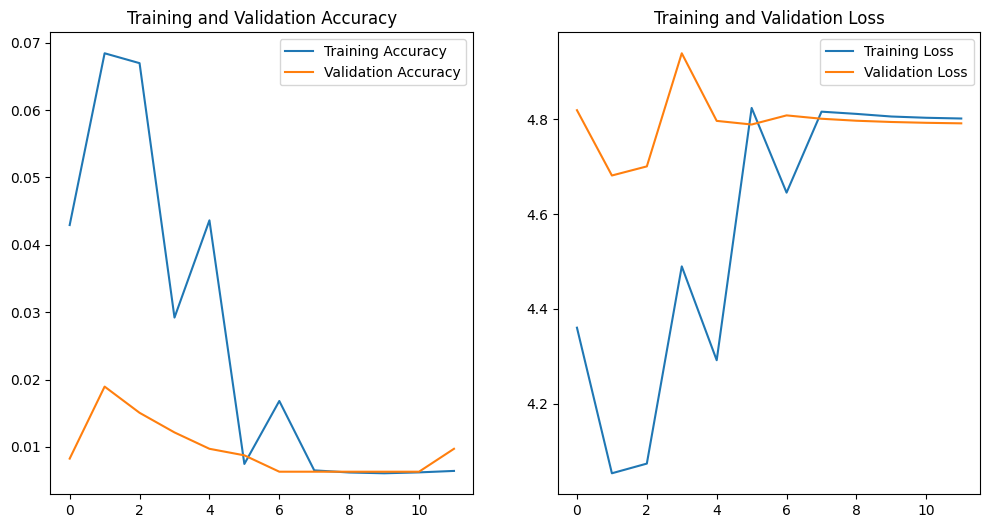

Training accuracy: 0.0064

Validation accuracy: 0.0097

33/33 [==============================] - 1s 15ms/step - loss: 4.6920 - accuracy: 0.0185

Test accuracy: 0.0185


In [47]:
history = model.fit(augmented_train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


In [48]:
def residual_block(x, filters, kernel_size=3, stride=1):
    fx = x
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, fx])
    x = layers.ReLU()(x)
    return x

#CNN model with the residual connections
def create_resnet_model():
    inputs = layers.Input(shape=(64, 64, 3))
    x = inputs
    x = layers.Conv2D(32, (3, 3), activation='relu',kernel_initializer='he_uniform', padding='same')(x)
    x = residual_block(x, 32)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Conv2D(64, (3, 3), activation='relu',kernel_initializer='he_uniform', padding='same')(x)
    x = residual_block(x, 64)
    x = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform',padding='same')(x)
    x = residual_block(x, 128)
    x = layers.MaxPooling2D((2, 2))(x)
#     x = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform',padding='same')(x)
#     x = residual_block(x, 256)
#     x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(120, activation='softmax')(x)
    model = models.Model(inputs, outputs)
    return model

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Create and compile the ResNet model
resnet_model = create_resnet_model()
resnet_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
history = resnet_model.fit(augmented_train_dataset, validation_data=val_dataset, epochs=50, callbacks=[early_stopping])

Epoch 1/50


2023-12-27 11:14:31.178521: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/dropout_22/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


469/469 [==============================] - 49s 85ms/step - loss: 4.9403 - accuracy: 0.0265 - val_loss: 5.5637 - val_accuracy: 0.0141

Epoch 2/50

469/469 [==============================] - 42s 83ms/step - loss: 4.2060 - accuracy: 0.0448 - val_loss: 5.5973 - val_accuracy: 0.0170

Epoch 3/50

469/469 [==============================] - 41s 83ms/step - loss: 4.0045 - accuracy: 0.0643 - val_loss: 5.4518 - val_accuracy: 0.0160

Epoch 4/50

469/469 [==============================] - 41s 83ms/step - loss: 3.8879 - accuracy: 0.0734 - val_loss: 5.2945 - val_accuracy: 0.0238

Epoch 5/50

469/469 [==============================] - 41s 83ms/step - loss: 3.8362 - accuracy: 0.0799 - val_loss: 5.9036 - val_accuracy: 0.0131

Epoch 6/50

469/469 [==============================] - 42s 85ms/step - loss: 3.7546 - accuracy: 0.0900 - val_loss: 5.9454 - val_accuracy: 0.0199

Epoch 7/50

469/469 [==============================] - 42s 83ms/step - loss: 3.7015 - accuracy: 0.0962 - val_loss: 5.0808 - val_accuracy

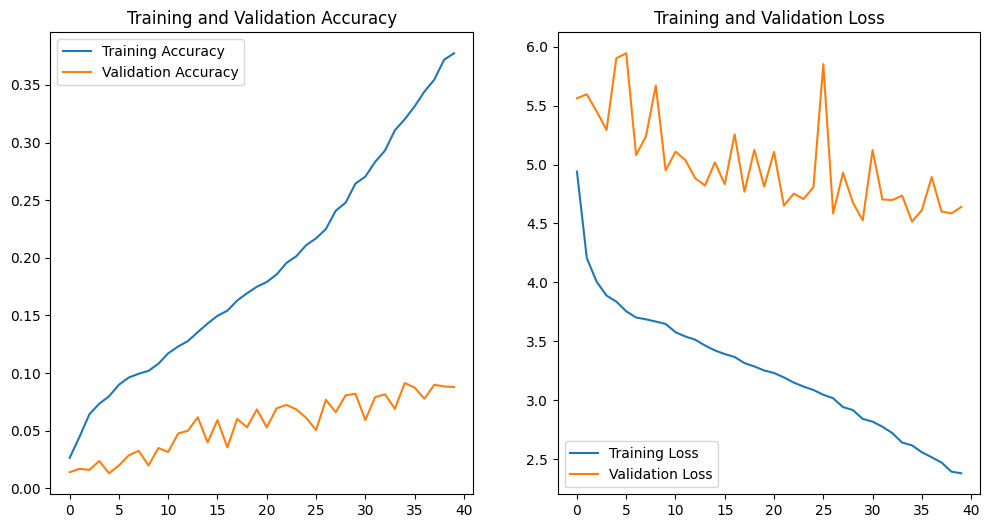

Training accuracy: 0.3774

Validation accuracy: 0.0879

33/33 [==============================] - 1s 15ms/step - loss: 4.6920 - accuracy: 0.0185

Test accuracy: 0.0185


In [49]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


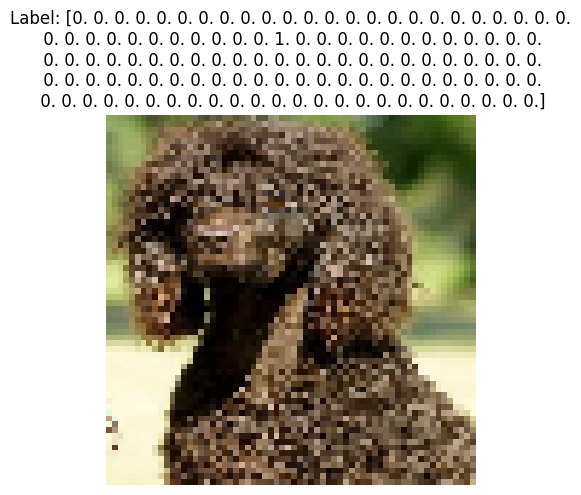

In [50]:
# Iterate through the dataset to get one batch
for batch in test_dataset.take(1):
    images, labels = batch  # Extract images and labels from the batch

# Visualize the first image in the batch along with its label as the title
first_image = images[0]  # Extract the first image from the batch
label = labels[0].numpy()  # Extract the label of the first image and convert to numpy

# Display the image using Matplotlib with the label as the title
plt.imshow(first_image)
plt.title(f'Label: {label}')
plt.axis('off')  # Turn off axis labels
plt.show()

# Transfer Learning / Complicated Models (224*224)

In [51]:
# Import data and create train, dev, test set

# Set your data directory
data_dir = 'data'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Assuming images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

# Use train_test_split to split the dataset into train, validation, and test sets
train_paths, val_test_paths, train_labels, val_test_labels = train_test_split(
    all_image_paths, all_image_labels, test_size=0.2, random_state=42)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    val_test_paths, val_test_labels, test_size=0.5, random_state=42)


train_labels_df = pd.DataFrame(train_labels, columns=['label'])
val_labels_df = pd.DataFrame(val_labels, columns=['label'])
test_labels_df = pd.DataFrame(test_labels, columns=['label'])

# Create a list of unique class names
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}

# Convert labels to integer labels using the dictionary
train_labels = [class_to_index[label] for label in train_labels]
val_labels = [class_to_index[label] for label in val_labels]
test_labels = [class_to_index[label] for label in test_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
train_labels = [boolean_encode(label, num_classes) for label in train_labels]
val_labels = [boolean_encode(label, num_classes) for label in val_labels]
test_labels = [boolean_encode(label, num_classes) for label in test_labels]

# Combine images and labels into datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_paths, test_labels))

# Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
train_dataset = train_dataset.map(load_and_preprocess_image)
val_dataset = val_dataset.map(load_and_preprocess_image)
test_dataset = test_dataset.map(load_and_preprocess_image)
print(len(train_dataset), len(val_dataset), len(test_dataset))

# Shuffle and batch the datasets
batch_size = 64
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

16464 2058 2058


In [52]:
# Recommended to use a training dataset with 224 x 224 dimensions for first time so that you can resize the pictures afterwards in any size you want
# Set your data directory
data_dir = 'augmented_images'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Augmented images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

    
augmented_train_labels_df = pd.DataFrame(all_image_labels, columns=['label'])
    
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}
    
# Convert labels to integer labels using the dictionary
augmented_train_labels = [class_to_index[label] for label in all_image_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
augmented_train_labels = [boolean_encode(label, num_classes) for label in augmented_train_labels]

# Combine images and labels into datasets
augmented_train_dataset = tf.data.Dataset.from_tensor_slices((all_image_paths, augmented_train_labels))

#Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
augmented_train_dataset = augmented_train_dataset.map(load_and_preprocess_image)

print(len(augmented_train_dataset))

# Shuffle and batch the datasets
batch_size = 128 # Increased from 64
augmented_train_dataset = augmented_train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

60000


# Pretrained VGG19

In [53]:
# Load the pre-trained VGG19 model
base_model = VGG19(include_top=False, input_shape=(224, 224, 3))

# Freeze VGG19 layers
for layer in base_model.layers:
    layer.trainable = False

# Create the model
model = models.Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=10)



80134624/80134624 [==============================] - 0s 0us/step

Epoch 1/10

258/258 [==============================] - 56s 177ms/step - loss: 4.8182 - accuracy: 0.0109 - val_loss: 5.6746 - val_accuracy: 0.0107

Epoch 2/10

258/258 [==============================] - 48s 168ms/step - loss: 4.7849 - accuracy: 0.0127 - val_loss: 4.7831 - val_accuracy: 0.0112

Epoch 3/10

258/258 [==============================] - 48s 168ms/step - loss: 4.7824 - accuracy: 0.0126 - val_loss: 34.5402 - val_accuracy: 0.0141

Epoch 4/10

258/258 [==============================] - 48s 168ms/step - loss: 4.7819 - accuracy: 0.0126 - val_loss: 4.7835 - val_accuracy: 0.0107

Epoch 5/10

258/258 [==============================] - 50s 168ms/step - loss: 4.7797 - accuracy: 0.0126 - val_loss: 4.7834 - val_accuracy: 0.0107

Epoch 6/10

258/258 [==============================] - 48s 168ms/step - loss: 4.7787 - accuracy: 0.0126 - val_loss: 4.7834 - val_accuracy: 0.0107

Epoch 7/10

258/258 [=============================

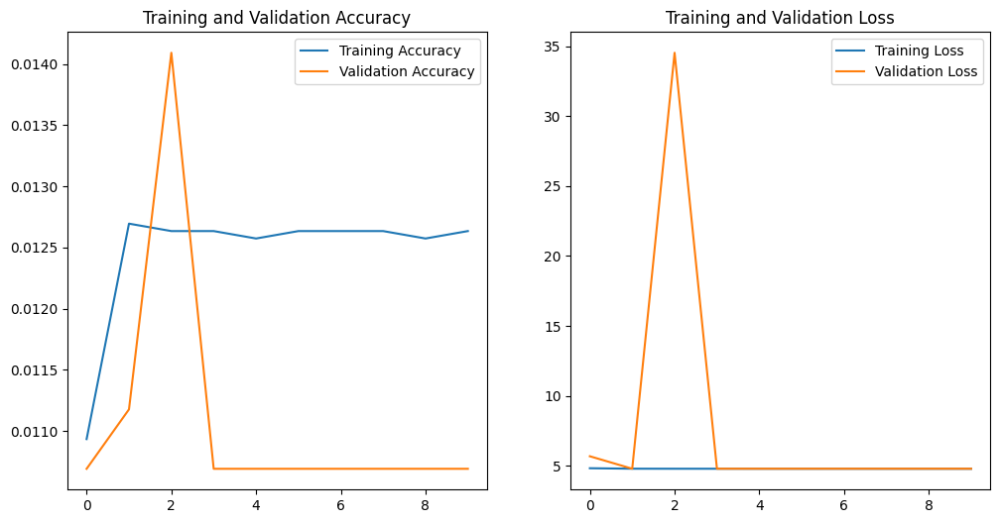

Training accuracy: 0.0126

Validation accuracy: 0.0107

33/33 [==============================] - 5s 138ms/step - loss: 4.7859 - accuracy: 0.0126

Test accuracy: 0.0126


In [54]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Pretrained ResNet

In [55]:
resnet_weights_path = '../input/resnet50/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

my_new_model = Sequential()
my_new_model.add(ResNet50(include_top=False, pooling='avg', weights=resnet_weights_path))
my_new_model.add(layers.Dense(120, activation='softmax'))

# Say not to train first layer (ResNet) model. It is already trained
my_new_model.layers[0].trainable = False

#my_new_model.summary()
my_new_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

history = my_new_model.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10

258/258 [==============================] - 43s 130ms/step - loss: 4.8261 - accuracy: 0.0134 - val_loss: 4.7859 - val_accuracy: 0.0170

Epoch 2/10

258/258 [==============================] - 37s 122ms/step - loss: 4.7313 - accuracy: 0.0198 - val_loss: 4.7050 - val_accuracy: 0.0209

Epoch 3/10

258/258 [==============================] - 36s 122ms/step - loss: 4.6857 - accuracy: 0.0237 - val_loss: 4.6858 - val_accuracy: 0.0190

Epoch 4/10

258/258 [==============================] - 37s 123ms/step - loss: 4.6488 - accuracy: 0.0258 - val_loss: 4.6529 - val_accuracy: 0.0248

Epoch 5/10

258/258 [==============================] - 37s 122ms/step - loss: 4.6187 - accuracy: 0.0319 - val_loss: 4.6510 - val_accuracy: 0.0248

Epoch 6/10

258/258 [==============================] - 37s 123ms/step - loss: 4.5951 - accuracy: 0.0349 - val_loss: 4.6464 - val_accuracy: 0.0296

Epoch 7/10

258/258 [==============================] - 37s 123ms/step - loss: 4.5761 - accuracy: 0.0363 - val_loss: 4.

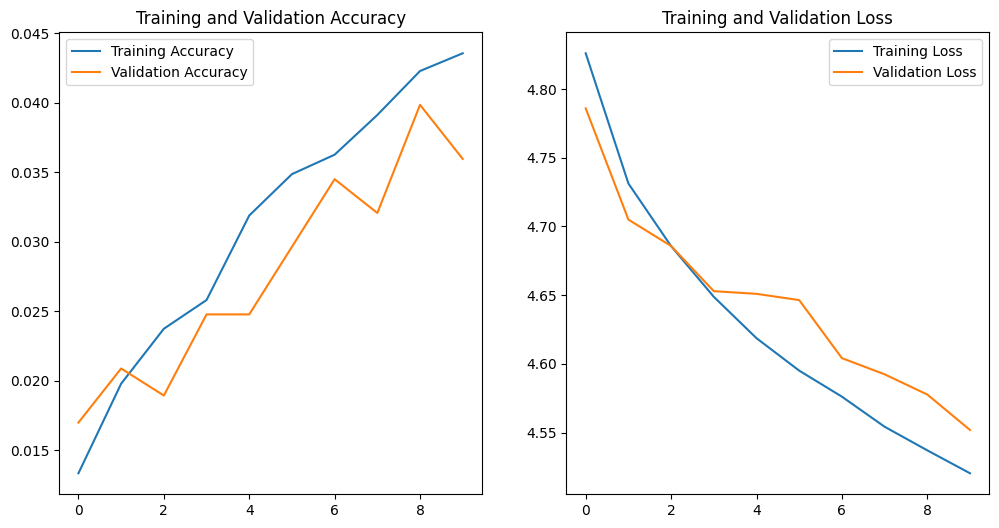

Training accuracy: 0.0435

Validation accuracy: 0.0360

33/33 [==============================] - 3s 99ms/step - loss: 4.5634 - accuracy: 0.0364

Test accuracy: 0.0364


In [56]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = my_new_model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Pretrained Inception V3 with image augmentation

In [59]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224,224, 3))

# Freeze InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# Create the model
model = models.Sequential()
model.add(base_model)
model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(augmented_train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10

469/469 [==============================] - 86s 161ms/step - loss: 2.7442 - accuracy: 0.4155 - val_loss: 1.6226 - val_accuracy: 0.6045

Epoch 2/10

469/469 [==============================] - 77s 155ms/step - loss: 1.7965 - accuracy: 0.5539 - val_loss: 1.1467 - val_accuracy: 0.6842

Epoch 3/10

469/469 [==============================] - 77s 155ms/step - loss: 1.6004 - accuracy: 0.5905 - val_loss: 0.9828 - val_accuracy: 0.7187

Epoch 4/10

469/469 [==============================] - 78s 155ms/step - loss: 1.5054 - accuracy: 0.6090 - val_loss: 0.9848 - val_accuracy: 0.7099

Epoch 5/10

469/469 [==============================] - 76s 154ms/step - loss: 1.4671 - accuracy: 0.6138 - val_loss: 0.9488 - val_accuracy: 0.7298

Epoch 6/10

469/469 [==============================] - 76s 155ms/step - loss: 1.4384 - accuracy: 0.6197 - val_loss: 1.0392 - val_accuracy: 0.7162

Epoch 7/10

469/469 [==============================] - 76s 154ms/step - loss: 1.4255 - accuracy: 0.6216 - val_loss: 0.

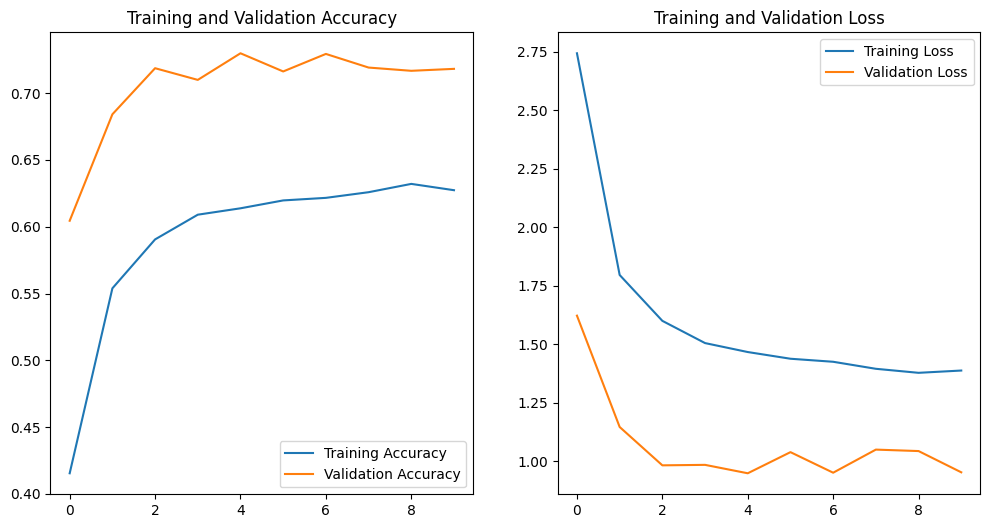

Training accuracy: 0.6273

Validation accuracy: 0.7182

33/33 [==============================] - 2s 72ms/step - loss: 0.9245 - accuracy: 0.7337

Test accuracy: 0.7337


In [60]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


# Pretrained Inception V3

In [ ]:
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224,224, 3))

# Freeze InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# Create the model
model = models.Sequential()
model.add(base_model)
model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=10)


87910968/87910968 [==============================] - 4s 0us/step

Epoch 1/10

258/258 [==============================] - 45s 105ms/step - loss: 1.4007 - accuracy: 0.6638 - val_loss: 0.4835 - val_accuracy: 0.8533

Epoch 2/10

258/258 [==============================] - 29s 92ms/step - loss: 0.6547 - accuracy: 0.8132 - val_loss: 0.4560 - val_accuracy: 0.8547

Epoch 3/10

258/258 [==============================] - 29s 93ms/step - loss: 0.5754 - accuracy: 0.8301 - val_loss: 0.4497 - val_accuracy: 0.8630

Epoch 4/10

258/258 [==============================] - 29s 93ms/step - loss: 0.5220 - accuracy: 0.8428 - val_loss: 0.4614 - val_accuracy: 0.8533

Epoch 5/10

258/258 [==============================] - 29s 93ms/step - loss: 0.4758 - accuracy: 0.8523 - val_loss: 0.4584 - val_accuracy: 0.8571

Epoch 6/10

258/258 [==============================] - 29s 93ms/step - loss: 0.4500 - accuracy: 0.8584 - val_loss: 0.4632 - val_accuracy: 0.8615

Epoch 7/10

258/258 [==============================] - 2

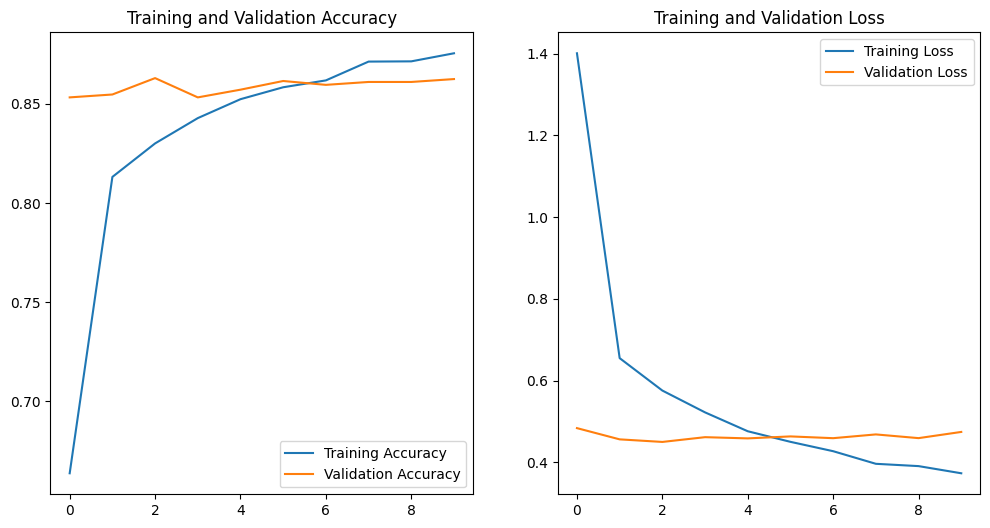

Training accuracy: 0.8755

Validation accuracy: 0.8625

33/33 [==============================] - 2s 71ms/step - loss: 0.4591 - accuracy: 0.8727

Test accuracy: 0.8727


In [ ]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


In [ ]:
model.save('/kaggle/working/inception.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

  saving_api.save_model(


# Pretrained Xception V3

In [ ]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224,224, 3))

# Freeze Xception layers
for layer in base_model.layers:
    layer.trainable = False

# Create the model
model = models.Sequential()
model.add(base_model)
model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(120, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_dataset, validation_data=val_dataset, epochs=10)


83683744/83683744 [==============================] - 4s 0us/step

Epoch 1/10

258/258 [==============================] - 53s 170ms/step - loss: 1.1774 - accuracy: 0.7170 - val_loss: 0.4087 - val_accuracy: 0.8790

Epoch 2/10

258/258 [==============================] - 47s 164ms/step - loss: 0.5382 - accuracy: 0.8404 - val_loss: 0.3943 - val_accuracy: 0.8707

Epoch 3/10

258/258 [==============================] - 47s 163ms/step - loss: 0.4790 - accuracy: 0.8562 - val_loss: 0.3849 - val_accuracy: 0.8751

Epoch 4/10

258/258 [==============================] - 46s 162ms/step - loss: 0.4167 - accuracy: 0.8717 - val_loss: 0.3755 - val_accuracy: 0.8780

Epoch 5/10

258/258 [==============================] - 47s 163ms/step - loss: 0.3791 - accuracy: 0.8796 - val_loss: 0.3851 - val_accuracy: 0.8810

Epoch 6/10

258/258 [==============================] - 47s 163ms/step - loss: 0.3534 - accuracy: 0.8841 - val_loss: 0.3867 - val_accuracy: 0.8771

Epoch 7/10

258/258 [==============================

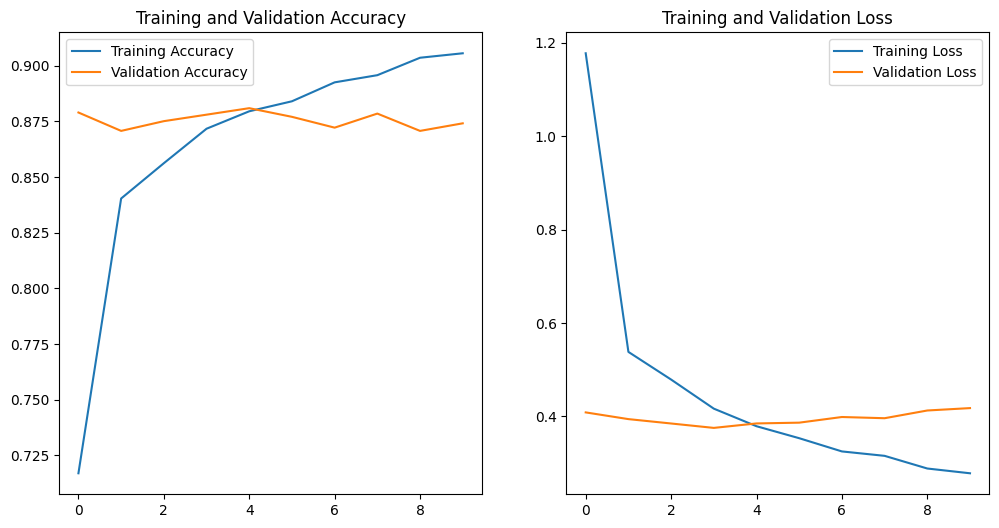

Training accuracy: 0.9056

Validation accuracy: 0.8741

33/33 [==============================] - 5s 136ms/step - loss: 0.4094 - accuracy: 0.8824

Test accuracy: 0.8824


In [ ]:
plot_results(history, epochs=10)

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")


In [ ]:
model.save('/kaggle/working/xception.h5')

# Predict new images

1/1 [==============================] - 0s 23ms/step

99.72% 	 Afghan_hound

0.14% 	 Saluki

0.08% 	 borzoi

0.03% 	 Japanese_spaniel

0.01% 	 Lhasa


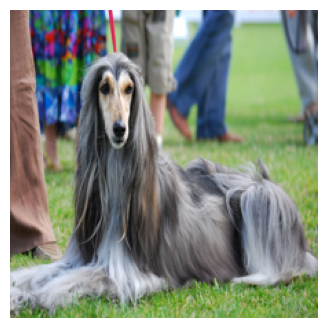

In [ ]:
def download_and_predict(url, filename):
    # download and save
    os.system("curl -s {} -o {}".format(url, filename))
    img = Image.open(filename)
    img = img.convert('RGB')
    img = img.resize((224, 224))
    img.save(filename)
    # show image
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    # predict
    img = imread(filename)
    img = preprocess_input(img)
    probs = model.predict(np.expand_dims(img, axis=0))
    for idx in probs.argsort()[0][::-1][:5]:
        print("{:.2f}%".format(probs[0][idx]*100), "\t", label_maps_rev[idx].split("-")[-1])
        
download_and_predict("https://upload.wikimedia.org/wikipedia/commons/5/54/Arabian_Hound_001_U.jpg","test_3.jpg")

# Error Analysis

In [ ]:
# Reverse the 'class_to_index' dictionary to map indices to class names
index_to_class = {index: class_name.split('-')[1] for class_name, index in class_to_index.items()}

incorrect_predictions = []

for images, labels in test_dataset:
    predictions = model.predict(images, verbose=0)
    predicted_labels = np.argmax(predictions, axis=1)
    true_labels = np.argmax(labels, axis=1)

    incorrect_indices = np.where(predicted_labels != true_labels)[0]

    if len(incorrect_indices) > 0:
        for index in incorrect_indices:
            image = images[index]
            predicted_label = predicted_labels[index]
            true_label = true_labels[index]

            # Translate numeric labels to class names without the prefix
            predicted_class_name = index_to_class[predicted_label]
            true_class_name = index_to_class[true_label]

            incorrect_predictions.append({
                'image': image,
                'predicted_label': predicted_class_name,
                'true_label': true_class_name
            })

# Analyze incorrect predictions
for i, incorrect in enumerate(incorrect_predictions):
    image = incorrect['image']
    predicted_label = incorrect['predicted_label']
    true_label = incorrect['true_label']

    # Visualize or log the information about the incorrect prediction
    print(f"Incorrect Prediction {i+1}: Predicted Label: {predicted_label}, True Label: {true_label}")
    # Display the image, plot, or log additional information

Incorrect Prediction 1: Predicted Label: standard_poodle, True Label: miniature_poodle

Incorrect Prediction 2: Predicted Label: cairn, True Label: Scotch_terrier

Incorrect Prediction 3: Predicted Label: Scotch_terrier, True Label: West_Highland_white_terrier

Incorrect Prediction 4: Predicted Label: soft, True Label: otterhound

Incorrect Prediction 5: Predicted Label: miniature_pinscher, True Label: toy_terrier

Incorrect Prediction 6: Predicted Label: American_Staffordshire_terrier, True Label: Staffordshire_bullterrier

Incorrect Prediction 7: Predicted Label: Appenzeller, True Label: EntleBucher

Incorrect Prediction 8: Predicted Label: toy_poodle, True Label: miniature_poodle

Incorrect Prediction 9: Predicted Label: Airedale, True Label: Australian_terrier

Incorrect Prediction 10: Predicted Label: Labrador_retriever, True Label: golden_retriever

Incorrect Prediction 11: Predicted Label: bluetick, True Label: German_short

Incorrect Prediction 12: Predicted Label: Chihuahua, T

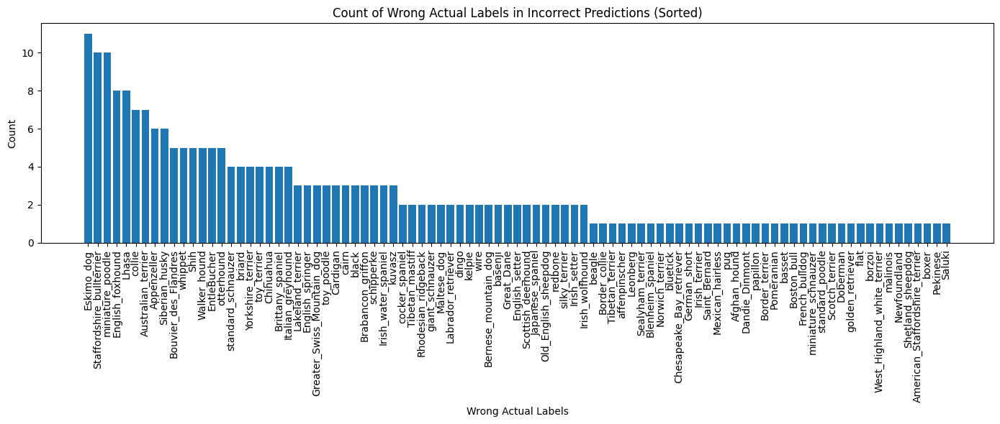

In [ ]:
# Count occurrences of wrong true labels in incorrect predictions
wrong_true_labels = [incorrect['true_label'] for incorrect in incorrect_predictions]
label_counts = {label: wrong_true_labels.count(label) for label in set(wrong_true_labels)}

# Sort labels by count in descending order
sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
sorted_labels, counts = zip(*sorted_labels)

# Plotting the histogram
plt.figure(figsize=(14, 6))
plt.bar(sorted_labels, counts)
plt.xlabel('Wrong Actual Labels')
plt.ylabel('Count')
plt.title('Count of Wrong Actual Labels in Incorrect Predictions (Sorted)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

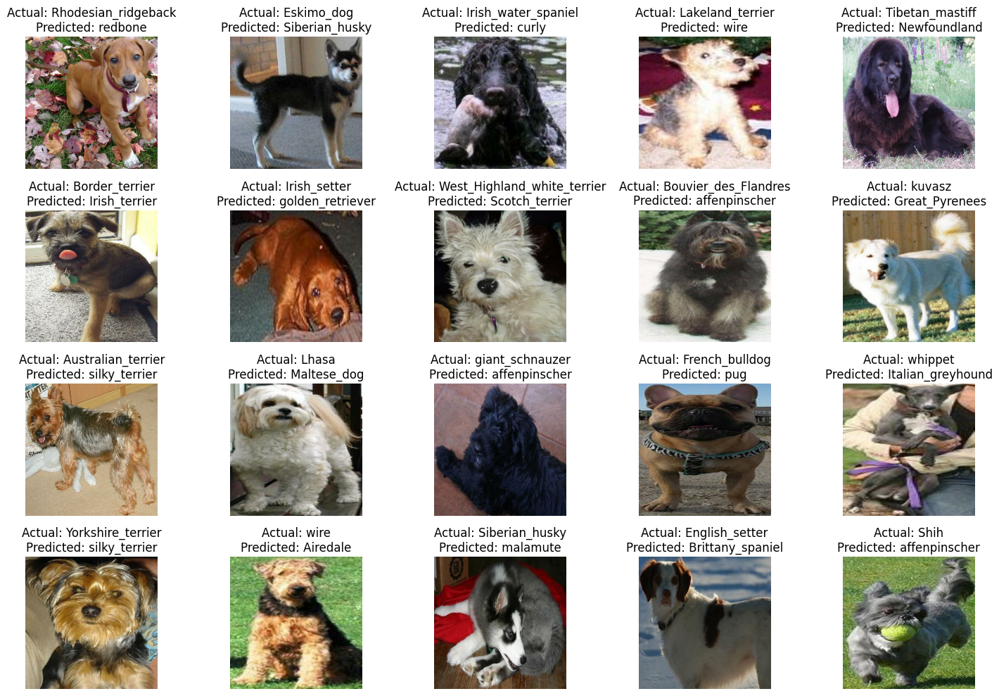

In [ ]:
# Randomly select incorrect predictions
random_incorrect_predictions = random.sample(incorrect_predictions, 20) # multiples of 5

# Plotting random incorrect predictions
plt.figure(figsize=(15, 10))
for i, prediction in enumerate(random_incorrect_predictions):
    plt.subplot(4, 5, i + 1) # Specify columns
    plt.imshow(prediction['image'])
    plt.title(f"Actual: {prediction['true_label']}\nPredicted: {prediction['predicted_label']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Transfer learning from CIFAR-10 Dataset (32*32)

### Step 1: Build a CNN for CIFAR-10 classification

In [62]:
# Load CIFAR-10 data
(train_images, train_labels), (test_images, test_labels) = cifar10.load_data()
train_images, test_images = train_images / 255.0, test_images / 255.0

# Convert labels to categorical for consistency
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

# Create CNN model
cifar_model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), activation='relu'),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),
    
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

# Compile the model
cifar_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
cifar_model.fit(train_images, train_labels, epochs=10, validation_data=(test_images, test_labels))


170498071/170498071 [==============================] - 5s 0us/step

Epoch 1/10


2023-12-27 12:20:32.534998: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_10/dropout_29/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


1563/1563 [==============================] - 13s 7ms/step - loss: 1.7894 - accuracy: 0.3416 - val_loss: 1.5657 - val_accuracy: 0.4427

Epoch 2/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.6312 - accuracy: 0.4118 - val_loss: 1.4874 - val_accuracy: 0.4615

Epoch 3/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.6445 - accuracy: 0.4073 - val_loss: 1.4613 - val_accuracy: 0.4742

Epoch 4/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.6994 - accuracy: 0.3918 - val_loss: 1.5582 - val_accuracy: 0.4396

Epoch 5/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.6809 - accuracy: 0.3963 - val_loss: 1.5929 - val_accuracy: 0.4339

Epoch 6/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.7164 - accuracy: 0.3843 - val_loss: 1.5044 - val_accuracy: 0.4451

Epoch 7/10

1563/1563 [==============================] - 10s 6ms/step - loss: 1.7200 - accuracy: 0.3843 - val_loss: 1.4944 - val_a

### Step 2: Perform Transfer Learning for Dog Breed Classification

In [63]:
# Set your data directory
data_dir = 'data'

# Use pathlib to get all subdirectories (classes) in the directory
data_root = pathlib.Path(data_dir)
class_directories = [directory for directory in data_root.glob('*') if directory.is_dir()]
class_names = sorted([item.name for item in data_root.glob('*') if item.is_dir()])

# Create lists to hold image paths and labels
all_image_paths = []
all_image_labels = []

# Loop through each class directory and gather image paths and labels
for class_directory in class_directories:
    class_label = class_directory.name
    class_image_paths = list(class_directory.glob('*.jpg'))  # Assuming images have .jpg extension
    
    # Append image paths and labels to the respective lists
    all_image_paths.extend([str(path) for path in class_image_paths])
    all_image_labels.extend([class_label] * len(class_image_paths))

# Use train_test_split to split the dataset into train, validation, and test sets
train_paths, val_test_paths, train_labels, val_test_labels = train_test_split(
    all_image_paths, all_image_labels, test_size=0.2, random_state=42)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    val_test_paths, val_test_labels, test_size=0.5, random_state=42)


train_labels_df = pd.DataFrame(train_labels, columns=['label'])
val_labels_df = pd.DataFrame(val_labels, columns=['label'])
test_labels_df = pd.DataFrame(test_labels, columns=['label'])

# Create a list of unique class names
# Define a custom sorting key function using regular expressions to extract letters after 'n[number]-'
def custom_sort_key(item):
    match = re.match(r'^n\d+-(.*)', item)
    if match:
        return match.group(1)
    else:
        return item  # If the pattern doesn't match, return the item as is

# Sort the list based on the letters after 'n[number]-'
unique_class_names = sorted(set(all_image_labels),key=custom_sort_key)

# Create a dictionary to map class names to integer labels
class_to_index = {class_name: i for i, class_name in enumerate(unique_class_names)}

# Convert labels to integer labels using the dictionary
train_labels = [class_to_index[label] for label in train_labels]
val_labels = [class_to_index[label] for label in val_labels]
test_labels = [class_to_index[label] for label in test_labels]

# Function to perform boolean encoding for labels
def boolean_encode(label, num_classes):
    boolean_label = tf.one_hot(label, depth=num_classes)
    return boolean_label

# Convert integer labels to boolean encoded labels
num_classes = len(unique_class_names)
train_labels = [boolean_encode(label, num_classes) for label in train_labels]
val_labels = [boolean_encode(label, num_classes) for label in val_labels]
test_labels = [boolean_encode(label, num_classes) for label in test_labels]

# Combine images and labels into datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_paths, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_paths, test_labels))

# Define image loading and preprocessing function
def load_and_preprocess_image(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [32, 32])  # Adjust as needed
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Map the image paths to (image, label) pairs
train_dataset = train_dataset.map(load_and_preprocess_image)
val_dataset = val_dataset.map(load_and_preprocess_image)
test_dataset = test_dataset.map(load_and_preprocess_image)
print(len(train_dataset), len(val_dataset), len(test_dataset))

# Shuffle and batch the datasets
batch_size = 64
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

16464 2058 2058


In [64]:
# Load the pre-trained CIFAR-10 model
base_model = cifar_model

# Modify the model for 120 dog breeds classification
# Replace the final layer(s) to match the number of classes (120 dog breeds)
base_model.pop()  # Remove the CIFAR-10 output layer
base_model.pop() 
base_model.pop() 
base_model.add(Dense(512, activation='relu'))
base_model.add(Dropout(0.5))
base_model.add(Dense(256, activation='relu'))
base_model.add(Dense(120, activation='softmax'))  # Add new output layer for 120 dog breeds

# Freeze layers to avoid re-training on CIFAR-10 weights
for layer in base_model.layers[:-4]:
    layer.trainable = False

# Compile the modified model
base_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model on the dog breed dataset
# Assuming you have data prepared in a similar format as CIFAR-10 but for 120 classes
history = base_model.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10


2023-12-27 12:22:40.561614: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_10/dropout_29/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 7s 13ms/step - loss: 28.5046 - accuracy: 0.0095 - val_loss: 16.6602 - val_accuracy: 0.0073

Epoch 2/10

258/258 [==============================] - 6s 13ms/step - loss: 4.8994 - accuracy: 0.0111 - val_loss: 18.2829 - val_accuracy: 0.0092

Epoch 3/10

258/258 [==============================] - 6s 12ms/step - loss: 4.8406 - accuracy: 0.0109 - val_loss: 18.9182 - val_accuracy: 0.0107

Epoch 4/10

258/258 [==============================] - 6s 12ms/step - loss: 4.8227 - accuracy: 0.0121 - val_loss: 17.3391 - val_accuracy: 0.0107

Epoch 5/10

258/258 [==============================] - 6s 12ms/step - loss: 4.8137 - accuracy: 0.0120 - val_loss: 20.1313 - val_accuracy: 0.0107

Epoch 6/10

258/258 [==============================] - 7s 14ms/step - loss: 4.8063 - accuracy: 0.0123 - val_loss: 21.3714 - val_accuracy: 0.0107

Epoch 7/10

258/258 [==============================] - 6s 12ms/step - loss: 4.7961 - accuracy: 0.0123 - val_loss: 20.8487 - val_accurac

In [65]:
# Unfreeze some layers for fine-tuning
for layer in base_model.layers[:-4]:  # Unfreeze all layers
    layer.trainable = True

# Recompile the model with a lower learning rate for fine-tuning
base_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model with fine-tuning
history= base_model.fit(train_dataset, validation_data=val_dataset, epochs=10)

Epoch 1/10


2023-12-27 12:23:49.269212: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_10/dropout_29/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


258/258 [==============================] - 9s 15ms/step - loss: 4.7957 - accuracy: 0.0123 - val_loss: 20.2583 - val_accuracy: 0.0107

Epoch 2/10

258/258 [==============================] - 7s 16ms/step - loss: 4.7970 - accuracy: 0.0122 - val_loss: 20.2707 - val_accuracy: 0.0107

Epoch 3/10

258/258 [==============================] - 7s 15ms/step - loss: 4.7944 - accuracy: 0.0122 - val_loss: 20.4379 - val_accuracy: 0.0107

Epoch 4/10

258/258 [==============================] - 7s 16ms/step - loss: 4.7930 - accuracy: 0.0125 - val_loss: 20.6018 - val_accuracy: 0.0107

Epoch 5/10

258/258 [==============================] - 7s 16ms/step - loss: 4.7901 - accuracy: 0.0123 - val_loss: 20.6993 - val_accuracy: 0.0107

Epoch 6/10

258/258 [==============================] - 7s 16ms/step - loss: 4.7921 - accuracy: 0.0123 - val_loss: 21.0122 - val_accuracy: 0.0107

Epoch 7/10

258/258 [==============================] - 6s 15ms/step - loss: 4.7888 - accuracy: 0.0123 - val_loss: 21.4636 - val_accuracy

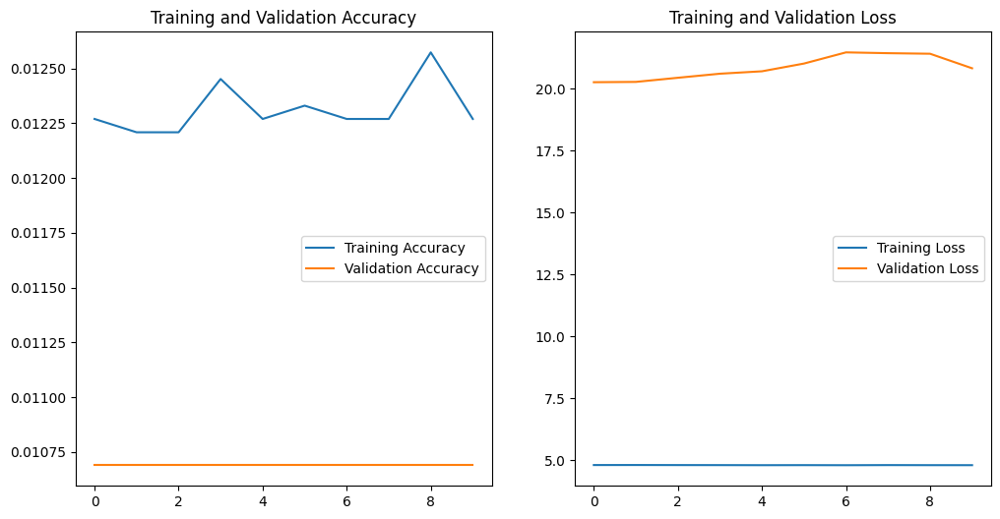

Training accuracy: 0.0123

Validation accuracy: 0.0107

33/33 [==============================] - 1s 17ms/step - loss: 29.6788 - accuracy: 0.0121

Test accuracy: 0.0121


In [66]:
plot_results(history, epochs=len(history.history['accuracy']))

# Access the final training accuracy and validation accuracy from the history
train_accuracy = history.history['accuracy'][-1]  # Take the last epoch's training accuracy
val_accuracy = history.history['val_accuracy'][-1]  # Take the last epoch's validation accuracy
print(f"Training accuracy: {train_accuracy:.4f}")
print(f"Validation accuracy: {val_accuracy:.4f}")

# Evaluate the model on the test set
test_loss, test_accuracy = base_model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")
